## Set up

In [1]:
# Imports
import requests
import zipfile
import io
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import pytz
import numpy as np
import math
import warnings
import seaborn as sns
import os
import shutil

# Suppress specific warnings (in this case, FutureWarnings)
warnings.simplefilter(action='ignore', category=FutureWarning)

from sktime.clustering.k_medoids import TimeSeriesKMedoids
from scipy.fftpack import fft, fftfreq
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.metrics import silhouette_score, davies_bouldin_score
from tslearn.clustering import KShape
from scipy.signal import welch
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import DBSCAN
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
import pandas as pd

In [138]:
# Pull the training, testing, and validation data
original_train_data = pd.read_parquet('dataset/cluster_1/training.parquet')
original_test_data = pd.read_parquet('dataset/cluster_1/test.parquet')
original_validation_data =  pd.read_parquet('dataset/cluster_1/validation.parquet')

In [140]:
# Calculate the sum to get the total electricity per customer per day and format it appropriately
train_total_consumption = original_train_data.sum(axis=0)
train_data = train_total_consumption.to_frame(name='y').reset_index()
train_data.columns = ['ds', 'y']

test_total_consumption = original_test_data.sum(axis=0)
test_data = test_total_consumption.to_frame(name='y').reset_index()
test_data.columns = ['ds', 'y']

validation_total_consumption = original_validation_data.sum(axis=0)
validation_data = validation_total_consumption.to_frame(name='y').reset_index()
validation_data.columns = ['ds', 'y']

In [142]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import pandas as pd

# Ensure the date column is in datetime format
train_data['ds'] = pd.to_datetime(train_data['ds'])

# Set it as the index
train_data.set_index('ds', inplace=True)

# Extract the time series values
series = train_data['y']

# Fit the Holt-Winters model (Additive trend & seasonality)
model = ExponentialSmoothing(series, trend="add", seasonal="add", seasonal_periods=12)
fitted_model = model.fit()



/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [144]:
# Forecast for the validation period
val_forecast = fitted_model.forecast(steps=len(validation_data))

# Evaluate performance on validation data
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

print(f"Validation MAE: {mae:.2f}")
print(f"Validation RMSE: {rmse:.2f}")

# Define function for MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Compute Mean Absolute Percentage Error (MAPE)
    - Handles division by zero by replacing zeros with a small value (1e-10)
    - Ignores NaN values

    Args:
        y_true (array-like): Actual values
        y_pred (array-like): Predicted values

    Returns:
        float: MAPE percentage
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Replace zeros in y_true to avoid division by zero
    y_true = np.where(y_true == 0, 1e-10, y_true)

    # Compute MAPE
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return mape

# Calculate MAPE on validation data
mape = mean_absolute_percentage_error(validation_data['y'], val_forecast)

print(f"Validation MAPE: {mape}%")



Validation MAE: 1525065.24
Validation RMSE: 1631309.65
Validation MAPE: 29.991497778071302%


Validation MAE: 1525065.24
Validation RMSE: 1631309.65


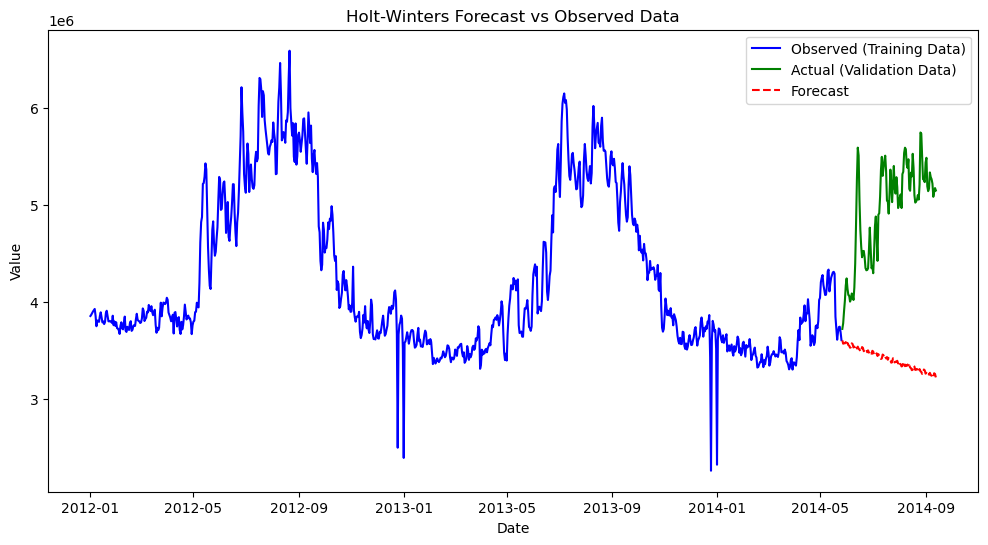

In [146]:
# Ensure the validation data's date column is in datetime format
validation_data['ds'] = pd.to_datetime(validation_data['ds'])
validation_data.set_index('ds', inplace=True)

# Ensure the forecast index is also in datetime format
forecast_index = pd.date_range(start=validation_data.index[0], periods=len(validation_data), freq='D')
val_forecast = pd.Series(val_forecast, index=forecast_index)  # Assign correct datetime index

# Evaluate model performance
mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

print(f"Validation MAE: {mae:.2f}")
print(f"Validation RMSE: {rmse:.2f}")

# Plot the results
plt.figure(figsize=(12, 6))

# Plot training data
plt.plot(series.index, series, label="Observed (Training Data)", color="blue")

# Plot validation (actual) data
plt.plot(validation_data.index, validation_data['y'], label="Actual (Validation Data)", color="green")

# Plot forecasted values
plt.plot(val_forecast.index, val_forecast, label="Forecast", color="red", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Value")
plt.title("Holt-Winters Forecast vs Observed Data")
plt.legend()
plt.show()

In [47]:
print('Cleaning the data...')
fifteen_minute_electricity_load_df = electricity_load_raw_df.rename(columns={'Unnamed: 0': 'timestamp'})

# Convert 'timestamp' to datetime
fifteen_minute_electricity_load_df['timestamp'] = pd.to_datetime(fifteen_minute_electricity_load_df['timestamp'], errors='coerce')

# Set index and sort timestamps to prepare for localization
fifteen_minute_electricity_load_df.set_index('timestamp', inplace=True)
fifteen_minute_electricity_load_df.sort_index(inplace=True)

# Identify non-numeric columns (excluding 'timestamp')
non_timestamp_columns = fifteen_minute_electricity_load_df.select_dtypes(include='object')

# Convert numeric-like strings (handling potential commas in decimal values)
for col in non_timestamp_columns.columns:
    fifteen_minute_electricity_load_df[col] = (
        fifteen_minute_electricity_load_df[col]
        .str.replace(',', '.', regex=False)  # Replace commas with dots
        .astype(float)  # Convert to float
    )

# Convert kW to kWh (only for relevant columns)
consumption_columns = fifteen_minute_electricity_load_df.columns  # Adjust if metadata columns exist
fifteen_minute_electricity_load_df[consumption_columns] = fifteen_minute_electricity_load_df[consumption_columns] / 4

# Identify the timestamps in March and October affected by the DST transition.
#
# When clocks move forward in March,
# timestamps between 1:00 AM and 2:00 AM do
# not exist.
#
# When clocks move backward in October, 01:00 AM happens
# twice. Pandas raises AmbiguousTimeError because
# it cannot automatically decide which 01:00 AM to
# use.
tz = pytz.timezone('Europe/Lisbon')
timestamps = pd.Series(fifteen_minute_electricity_load_df.index)
localized_nat_mask = timestamps.dt.tz_localize(tz=tz, ambiguous='NaT', nonexistent='NaT').isna().values

march_dates_mask = (timestamps.dt.month == 3).values
october_dates_mask = (timestamps.dt.month == 10).values

dst_affected_march_dates = (localized_nat_mask & march_dates_mask)
dst_affected_october_dates = (localized_nat_mask & october_dates_mask)

# Make sure that all NaT dates are only the ones in March and
# October affected by the DST transition
assert np.all((dst_affected_march_dates | dst_affected_october_dates) == localized_nat_mask)

# Divide by 2 the loads for timestamps in October affected by DST
fifteen_minute_electricity_load_df[dst_affected_october_dates] /= 2

# Fill missing March DST timestamps with interpolated values
fifteen_minute_electricity_load_df[dst_affected_march_dates] = np.nan
fifteen_minute_electricity_load_df.interpolate(method='time', inplace=True)

# Replace leading 0s with NaNs so it is easier to identify when a ccustomer
# started consumption.
def replace_leading_zeros_column(column):
    first_nonzero = (column != 0).idxmax()
    if first_nonzero is not None:
        column.loc[:first_nonzero] = np.nan
    return column

fifteen_minute_electricity_load_df = fifteen_minute_electricity_load_df.apply(
    replace_leading_zeros_column, axis=0)

# Localize to Europe/Lisbon
fifteen_minute_electricity_load_df = (
    fifteen_minute_electricity_load_df.tz_localize('UTC')
    .tz_convert('Europe/Lisbon')
)

# Make sure all timestamps are 15 minutes apart
assert not (fifteen_minute_electricity_load_df.index.diff()[1:].total_seconds() / 60 != 15).any()

print('\tCleaning complete.')
print(f'Number of rows: {len(fifteen_minute_electricity_load_df.index)}')
fifteen_minute_electricity_load_df.head()

Cleaning the data...
	Cleaning complete.
Number of rows: 140256


,MT_001,MT_002,MT_003,MT_004,MT_005,MT_006,MT_007,MT_008,MT_009,MT_010,...,MT_361,MT_362,MT_363,MT_364,MT_365,MT_366,MT_367,MT_368,MT_369,MT_370
timestamp,,,,,,,,,,,,,,,,,,,,,
2011-01-01 00:15:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-01 00:30:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-01 00:45:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-01 01:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-01 01:15:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
# Prepare data at different granularities
hourly_electricity_load_df = fifteen_minute_electricity_load_df.resample('1h').sum(min_count=1).sort_index()
daily_electricity_load_df = fifteen_minute_electricity_load_df.resample('1d').sum(min_count=1).sort_index()
weekly_electricity_load_df = fifteen_minute_electricity_load_df.resample('1W').sum(min_count=1).sort_index()
monthly_electricity_load_df = fifteen_minute_electricity_load_df.resample('1ME').sum(min_count=1).sort_index()

In [38]:
fifteen_minute_electricity_load_df[dst_affected_october_dates]

,MT_001,MT_002,MT_003,MT_004,MT_005,MT_006,MT_007,MT_008,MT_009,MT_010,...,MT_361,MT_362,MT_363,MT_364,MT_365,MT_366,MT_367,MT_368,MT_369,MT_370
timestamp,,,,,,,,,,,,,,,,,,,,,
2011-10-30 01:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-10-30 01:15:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-10-30 01:30:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-10-30 01:45:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-10-28 01:00:00+00:00,0.634518,5.512091,0.434405,34.044715,25.914634,66.220238,1.413228,114.478114,21.416084,17.473118,...,24.803712,15050.0,470.464135,482.954545,9.778357,5.266238,247.146620,14.607679,174.486804,NaN
2012-10-28 01:15:00+00:00,0.634518,5.334282,0.434405,33.536585,25.304878,59.523810,1.413228,111.952862,19.667832,17.204301,...,20.877944,14725.0,434.599156,471.590909,9.778357,4.681100,263.827919,14.190317,175.586510,NaN
2012-10-28 01:30:00+00:00,0.951777,5.512091,0.434405,32.012195,21.646341,60.267857,1.413228,111.952862,20.541958,18.010753,...,16.952177,14425.0,421.940928,471.590909,9.126467,3.364541,256.365233,15.442404,177.602639,NaN
2012-10-28 01:45:00+00:00,0.634518,5.334282,0.651607,30.995935,23.170732,63.244048,1.130582,101.010101,19.667832,17.473118,...,15.167737,14425.0,421.940928,465.909091,9.452412,2.925688,280.728709,15.442404,173.570381,NaN
2013-10-27 01:00:00+00:00,1.269036,11.913229,0.868810,44.715447,22.865854,66.220238,2.119842,107.744108,17.482517,19.623656,...,31.049251,12650.0,544.303797,585.227273,8.800522,5.705091,136.303775,25.459098,351.906158,4043.243243


In [46]:
wrong_fifteen_minute_electricity_load_df = fifteen_minute_electricity_load_df

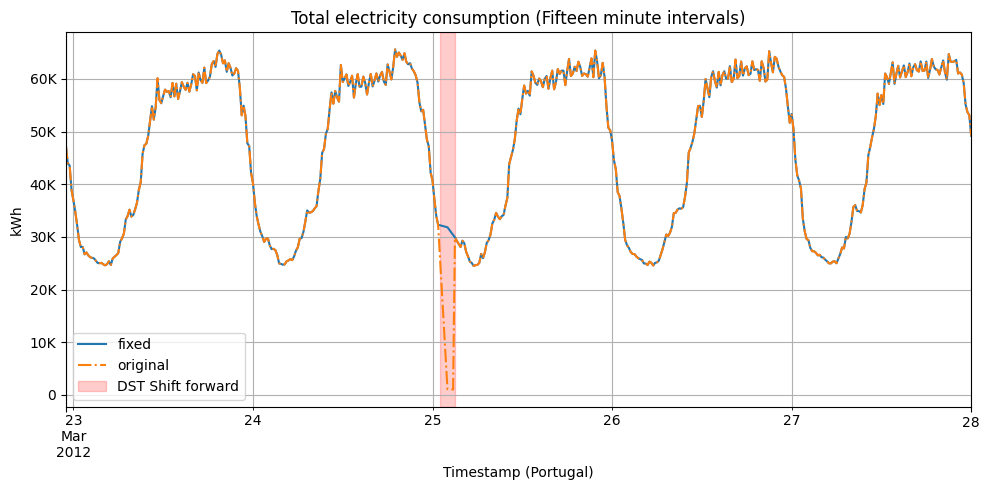

In [51]:
timestamps = fifteen_minute_electricity_load_df.index

mask = (pd.to_datetime('2012-03-23 00:00:00+01:00') <= timestamps) & (timestamps <= pd.to_datetime('2012-03-28 00:00:00+01:00'))

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))

fifteen_minute_electricity_load_df[mask].sum(axis=1).sort_index().plot(ax=ax, label='fixed')
wrong_fifteen_minute_electricity_load_df[mask].sum(axis=1).sort_index().plot(ax=ax, label='original', linestyle='-.')

ax.axvspan(
    pd.to_datetime('2012-03-25 01:00:00+01:00'),
    pd.to_datetime('2012-03-25 03:00:00+01:00'),
    color='red',
    alpha=0.2,
    label='DST Shift forward'
)

ax.set_title('Total electricity consumption (Fifteen minute intervals)')
ax.set_xlabel('Timestamp (Portugal)')
ax.set_ylabel('kWh')
ax.grid(True, which='both')
ax.legend()

make_axes_human_readable(ax)

plt.tight_layout()
plt.show()

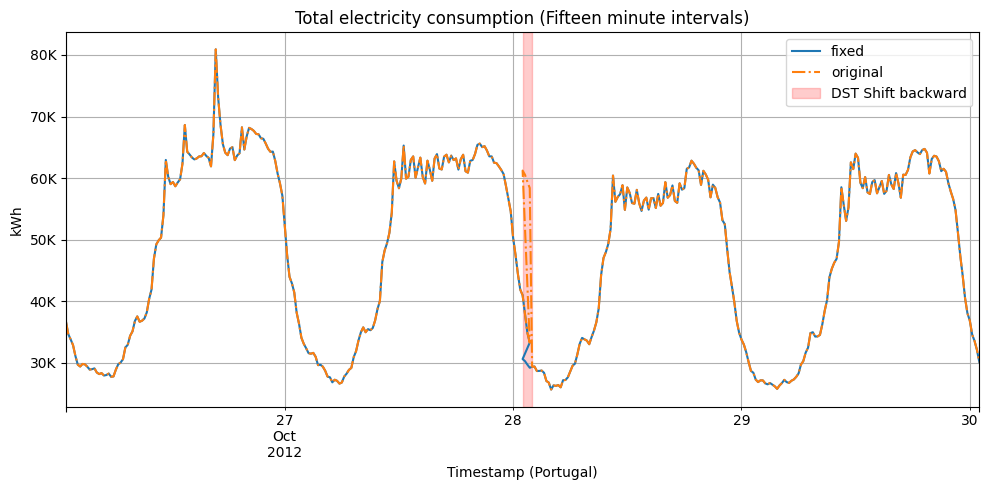

In [52]:
timestamps = fifteen_minute_electricity_load_df.index

mask = (pd.to_datetime('2012-10-26 00:00:00+00:00') <= timestamps) & (timestamps <= pd.to_datetime('2012-10-30 01:00:00+00:00'))

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))

fifteen_minute_electricity_load_df[mask].sum(axis=1).sort_index().plot(ax=ax, label='fixed')
wrong_fifteen_minute_electricity_load_df[mask].sum(axis=1).sort_index().plot(ax=ax, label='original', linestyle='-.')
ax.axvspan(
    pd.to_datetime('2012-10-28 01:00:00+00:00'),
    pd.to_datetime('2012-10-28 02:00:00+00:00'),
    color='red',
    alpha=0.2,
    label='DST Shift backward'
)

ax.set_title('Total electricity consumption (Fifteen minute intervals)')
ax.set_xlabel('Timestamp (Portugal)')
ax.set_ylabel('kWh')
ax.grid(True, which='both')
ax.legend()

make_axes_human_readable(ax)

plt.tight_layout()
plt.show()

## Preliminary exploration

### Start and end times

In [16]:
# Identify non-zero values for each customer (assuming customers' columns start from 'MT_001' to 'MT_370')
start_end_times = {}

for customer in fifteen_minute_electricity_load_df.columns:
    # Find the first and last non-zero consumption for each customer
    customer_data = fifteen_minute_electricity_load_df[customer].fillna(0)
    
    # Identify periods of non-zero activity
    non_zero_activity = customer_data[customer_data > 0]
    
    if not non_zero_activity.empty:
        start_time = non_zero_activity.index[0]  # First non-zero value (start)
        end_time = non_zero_activity.index[-1]  # Last non-zero value (end)
        start_end_times[customer] = {"start": start_time, "end": end_time}
    else:
        start_end_times[customer] = {"start": None, "end": None}

# Convert the result into a DataFrame for easy visualization
start_end_df = pd.DataFrame.from_dict(start_end_times, orient="index")
start_end_df.describe(percentiles=[0.10, 0.25, 0.30, 0.40, 0.45, 0.50, 0.75, 0.90]).T

,count,mean,min,10%,25%,30%,40%,45%,50%,75%,90%,max
start,370,2011-10-08 10:03:36.486486272+01:00,2011-01-01 00:30:00+00:00,2011-01-01 00:30:00+00:00,2011-01-01 00:30:00+00:00,2011-01-01 00:30:00+00:00,2011-01-01 00:30:00+00:00,2012-01-01 00:30:00+00:00,2012-01-01 00:30:00+00:00,2012-01-01 00:30:00+00:00,2012-11-21 03:43:30+00:00,2014-07-18 01:30:00+01:00
end,370,2014-12-29 17:18:09.729729792+00:00,2012-09-23 06:30:00+01:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-01-01 00:00:00+00:00


### All customers visualization

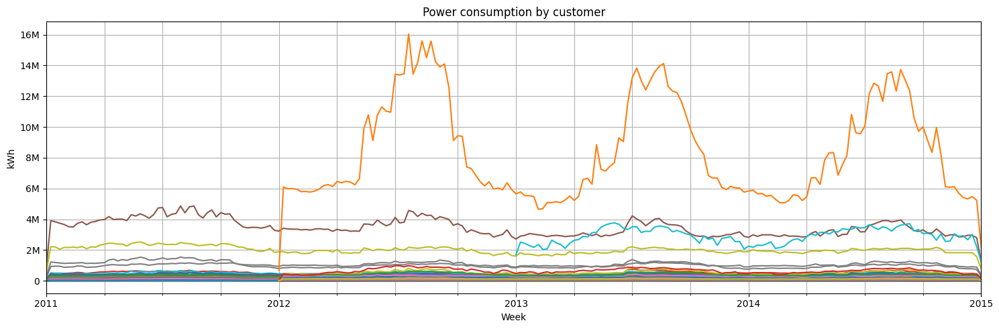

In [13]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,5))

weekly_electricity_load_df.plot(ax=ax)

ax.legend().remove()
make_axes_human_readable(ax)
ax.set_title('Power consumption by customer')
ax.set_xlabel('Week')
ax.set_ylabel('kWh')
ax.grid(True, which='both')

plt.tight_layout()
plt.show()

### Statistics visualization

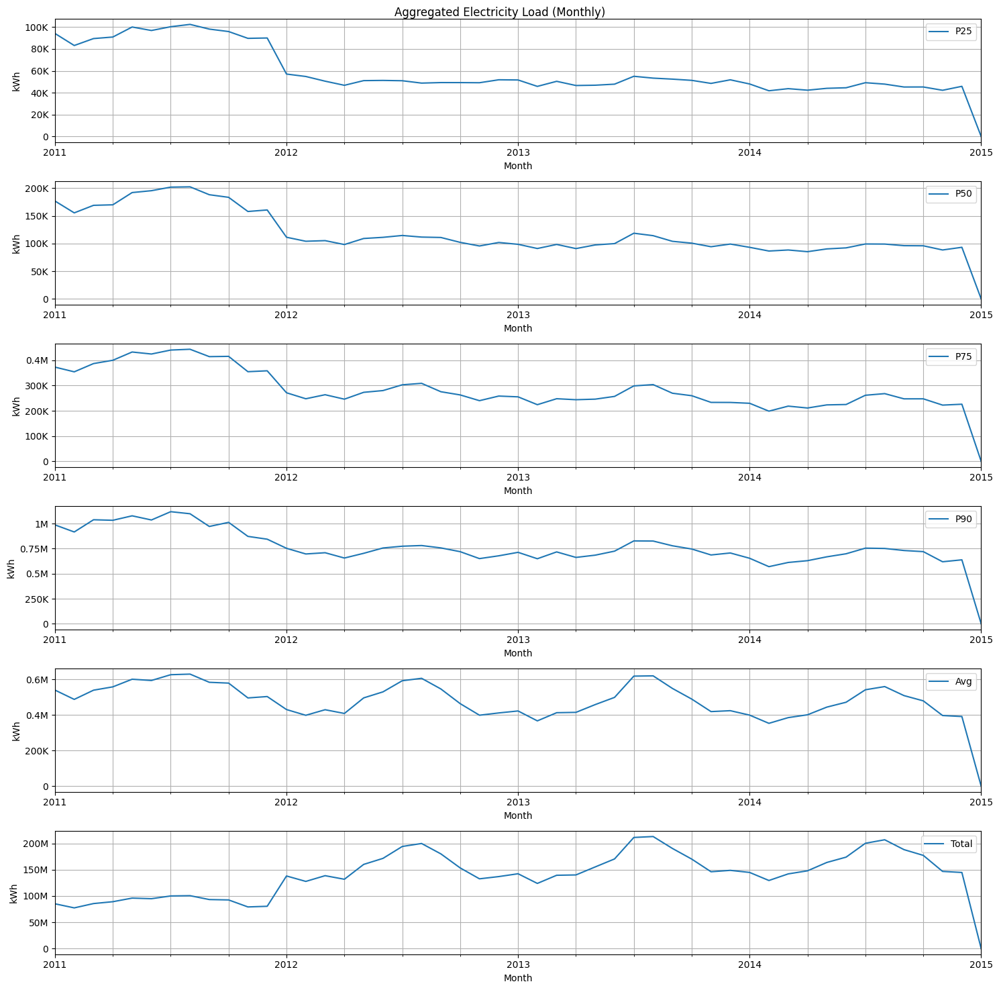

In [13]:
# Monthly
metrics = {
    'P25': monthly_electricity_load_df.quantile(0.25, axis=1),
    'P50': monthly_electricity_load_df.quantile(0.50, axis=1),
    'P75': monthly_electricity_load_df.quantile(0.75, axis=1),
    'P90': monthly_electricity_load_df.quantile(0.90, axis=1),
    'Avg': monthly_electricity_load_df.mean(axis=1),
    'Total': monthly_electricity_load_df.sum(axis=1),
}

fig, axs = plt.subplots(nrows=len(metrics), ncols=1, figsize=(15,15))

fig.suptitle('Aggregated Electricity Load (Monthly)')

for ax, (metric, values) in zip(axs, metrics.items()):
    values.plot(ax=ax, label=metric)
    make_axes_human_readable(ax)
    ax.set_xlabel('Month')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

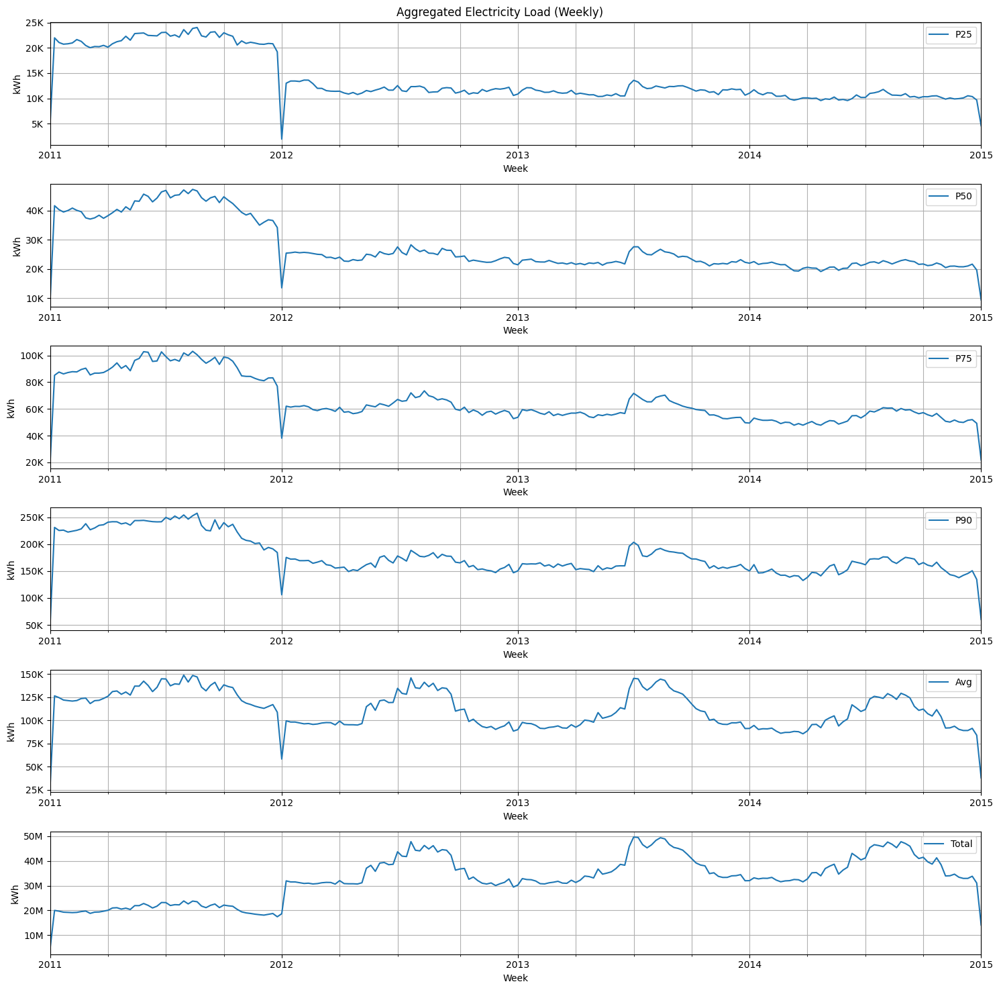

In [17]:
# Weekly
metrics = {
    'P25': weekly_electricity_load_df.quantile(0.25, axis=1),
    'P50': weekly_electricity_load_df.quantile(0.50, axis=1),
    'P75': weekly_electricity_load_df.quantile(0.75, axis=1),
    'P90': weekly_electricity_load_df.quantile(0.90, axis=1),
    'Avg': weekly_electricity_load_df.mean(axis=1),
    'Total': weekly_electricity_load_df.sum(axis=1),
}

fig, axs = plt.subplots(nrows=len(metrics), ncols=1, figsize=(15,15))

fig.suptitle('Aggregated Electricity Load (Weekly)')

for ax, (metric, values) in zip(axs, metrics.items()):
    values.plot(ax=ax, label=metric)
    make_axes_human_readable(ax)
    ax.set_xlabel('Week')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

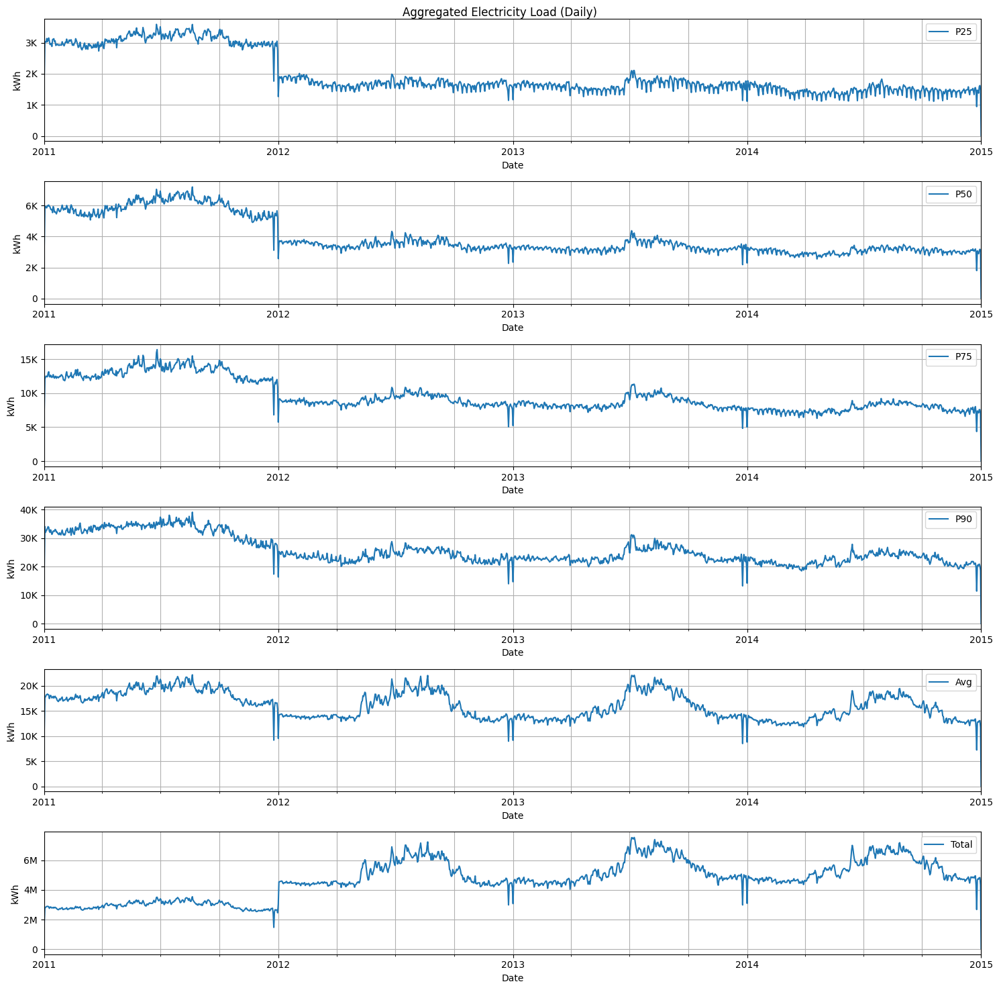

In [18]:
# Daily
metrics = {
    'P25': daily_electricity_load_df.quantile(0.25, axis=1),
    'P50': daily_electricity_load_df.quantile(0.50, axis=1),
    'P75': daily_electricity_load_df.quantile(0.75, axis=1),
    'P90': daily_electricity_load_df.quantile(0.90, axis=1),
    'Avg': daily_electricity_load_df.mean(axis=1),
    'Total': daily_electricity_load_df.sum(axis=1),
}

fig, axs = plt.subplots(nrows=len(metrics), ncols=1, figsize=(15,15))

fig.suptitle('Aggregated Electricity Load (Daily)')

for ax, (metric, values) in zip(axs, metrics.items()):
    values.plot(ax=ax, label=metric)
    make_axes_human_readable(ax)
    ax.set_xlabel('Date')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

### Visualize some random customers

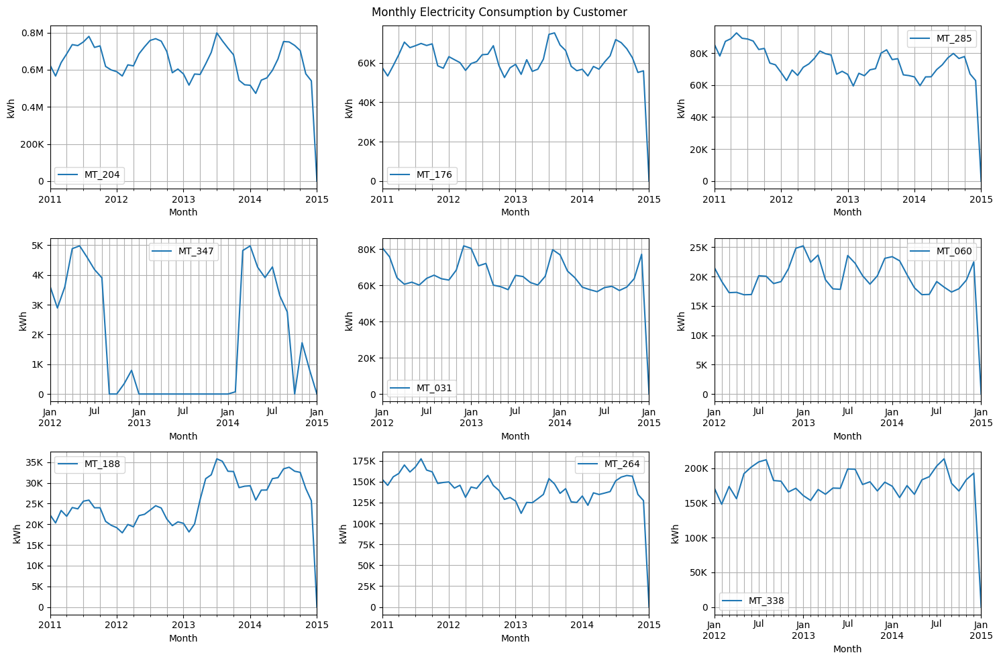

In [14]:
# Montly usage
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,10))

fig.suptitle('Monthly Electricity Consumption by Customer')

axs = axs.flatten()
sampled_columns = np.random.choice(monthly_electricity_load_df.columns.values, size=len(axs), replace=False)
for ax, column in zip(axs, sampled_columns):
    monthly_electricity_load_df[column].dropna().plot(ax=ax, label=column)
    make_axes_human_readable(ax)
    ax.set_xlabel('Month')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

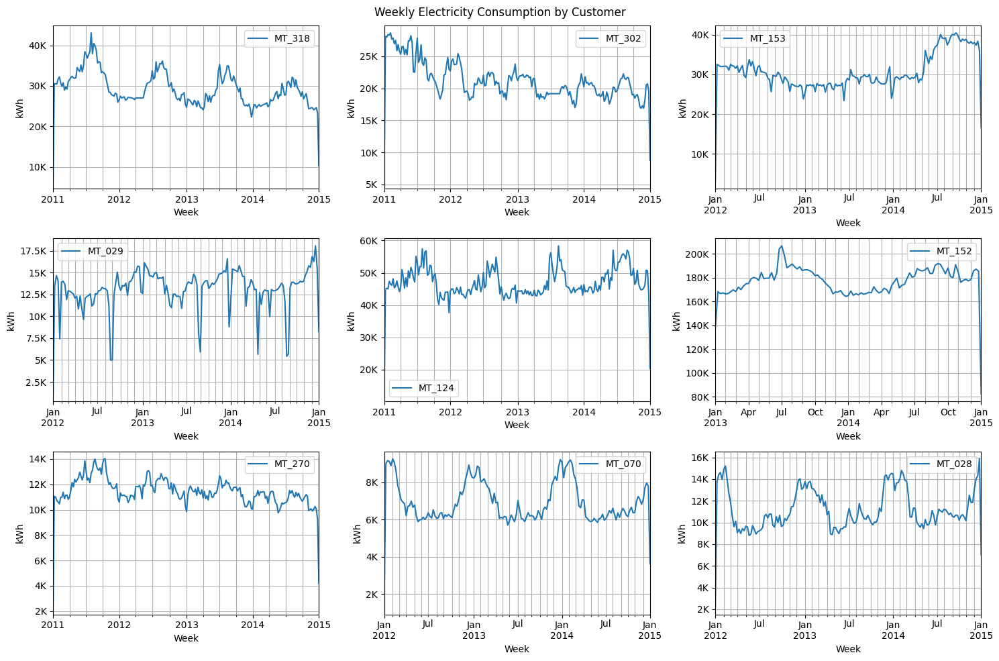

In [28]:
# Weekly usage
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,10))

fig.suptitle('Weekly Electricity Consumption by Customer')

axs = axs.flatten()
for ax, column in zip(axs, sampled_columns):
    weekly_electricity_load_df[column].dropna().plot(ax=ax, label=column)
    make_axes_human_readable(ax)
    ax.set_xlabel('Week')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

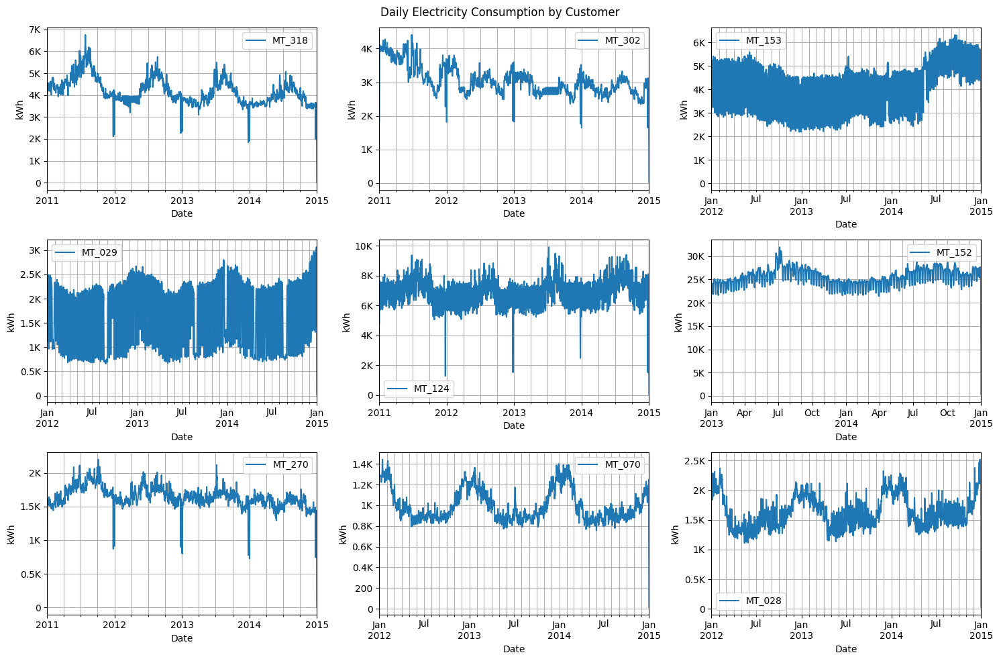

In [29]:
# Daily usage
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,10))

fig.suptitle('Daily Electricity Consumption by Customer')

axs = axs.flatten()
for ax, column in zip(axs, sampled_columns):
    daily_electricity_load_df[column].dropna().plot(ax=ax, label=column)
    make_axes_human_readable(ax)
    ax.set_xlabel('Date')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

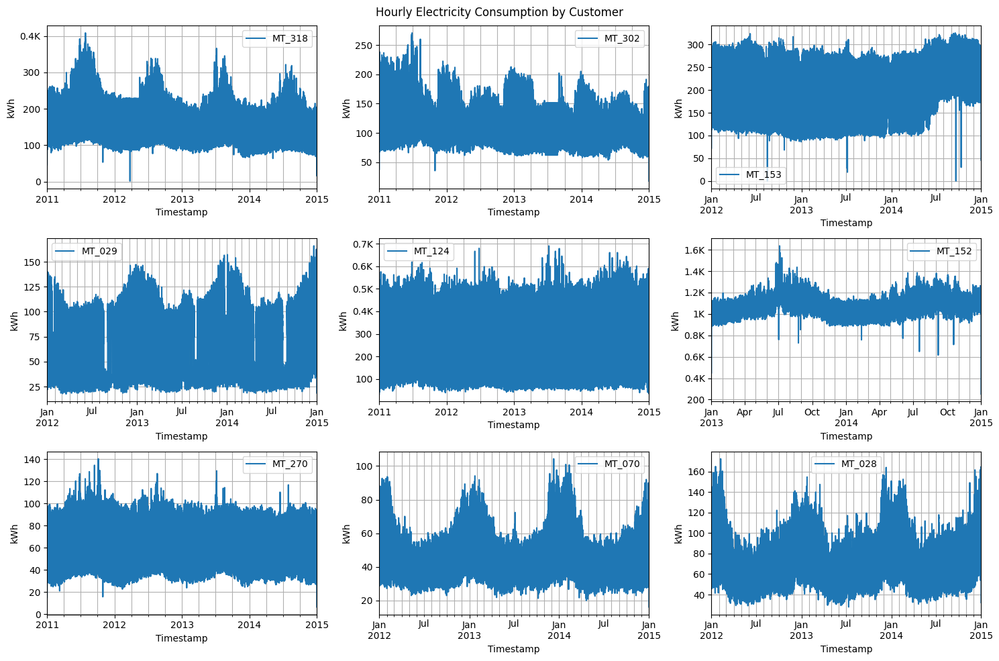

In [30]:
# Hourly usage
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,10))

fig.suptitle('Hourly Electricity Consumption by Customer')

axs = axs.flatten()
for ax, column in zip(axs, sampled_columns):
    hourly_electricity_load_df[column].dropna().plot(ax=ax)
    make_axes_human_readable(ax)
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

## Filtering the dataset

Some customers have a very short time series while others have a very long one.

Based on the prelimininary analysis above, we see that 90% of customers started on or before 2012-01-01, while 90%+ ended on 2015-01-01.

To make clustering and the models more accurate, we will trim the times series to be the same length.

This means we will:
1. Remove all customers that started after 2012-01-01 or finished before 2015-01-01.
2. Truncate the time series of customers that started before 2012-01-01 to 2012-01-01. This will get rid of a year's worth of data for these customers, but we will still have 3 years left. Since our dataset has an hourly granularity, this should leave plenty of data to train on.

In [56]:
# Remove customers
start_end_times = {}

for customer in fifteen_minute_electricity_load_df.columns:
    # Find the first and last non-zero consumption for each customer
    customer_data = fifteen_minute_electricity_load_df[customer].fillna(0)
    
    # Identify periods of non-zero activity
    non_zero_activity = customer_data[customer_data > 0]
    
    if not non_zero_activity.empty:
        start_time = non_zero_activity.index[0]  # First non-zero value (start)
        end_time = non_zero_activity.index[-1]  # Last non-zero value (end)
        start_end_times[customer] = {"start": start_time, "end": end_time}
    else:
        start_end_times[customer] = {"start": None, "end": None}

start_end_df = pd.DataFrame.from_dict(start_end_times, orient="index")

started_too_late_mask = start_end_df['start'] > pd.to_datetime('2012-01-01 00:30:00+00:00')
ended_too_early_mask = start_end_df['end'] < pd.to_datetime('2015-01-01 00:00:00+00:00')
customers_to_remove_mask = started_too_late_mask | ended_too_early_mask
print(f'Percentage of customers to remove: {customers_to_remove_mask.mean() * 100:.2f}%')

customers_to_keep_names = fifteen_minute_electricity_load_df.columns[~customers_to_remove_mask]

filtered_fifteen_minute_electricity_load_df = fifteen_minute_electricity_load_df[customers_to_keep_names]

Percentage of customers to remove: 14.32%


In [57]:
# Truncate the time series
fifteen_minute_truncate_mask = (
    (filtered_fifteen_minute_electricity_load_df.index > pd.to_datetime('2012-01-02 00:00:00+00:00'))
    & (filtered_fifteen_minute_electricity_load_df.index < pd.to_datetime('2015-01-01 00:00:00+00:00'))
)
filtered_fifteen_minute_electricity_load_df = filtered_fifteen_minute_electricity_load_df[fifteen_minute_truncate_mask]

filtered_ourly_electricity_load_df = filtered_fifteen_minute_electricity_load_df.resample('1h').sum(min_count=1).sort_index()
filtered_daily_electricity_load_df = filtered_fifteen_minute_electricity_load_df.resample('1d').sum(min_count=1).sort_index()
filtered_weekly_electricity_load_df = filtered_fifteen_minute_electricity_load_df.resample('1W').sum(min_count=1).sort_index()
filtered_monthly_electricity_load_df = filtered_fifteen_minute_electricity_load_df.resample('1ME').sum(min_count=1).sort_index()

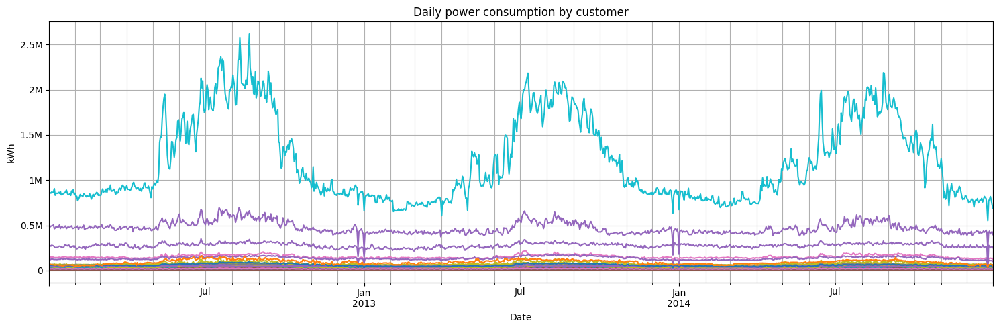

In [289]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,5))

filtered_daily_electricity_load_df.plot(ax=ax)

ax.legend().remove()
make_axes_human_readable(ax)
ax.set_title('Daily power consumption by customer')
ax.set_xlabel('Date')
ax.set_ylabel('kWh')
ax.grid(True, which='both')

plt.tight_layout()
plt.show()

## Clustering customers

I discussed with the Professor during office hours and we should **not** create one model per customer (i.e. 370 diffrent models). Instead, we should group customers who are "similar" together into a cluster and create a model for each cluster. The way we define similarlity is up to us.

### Normalize the time series

In [58]:
def normalize_series(series: pd.Series):
    return (series - series.mean()) / series.std()

normalized_daily_electricity_load_df = filtered_daily_electricity_load_df.apply(normalize_series, axis=0)

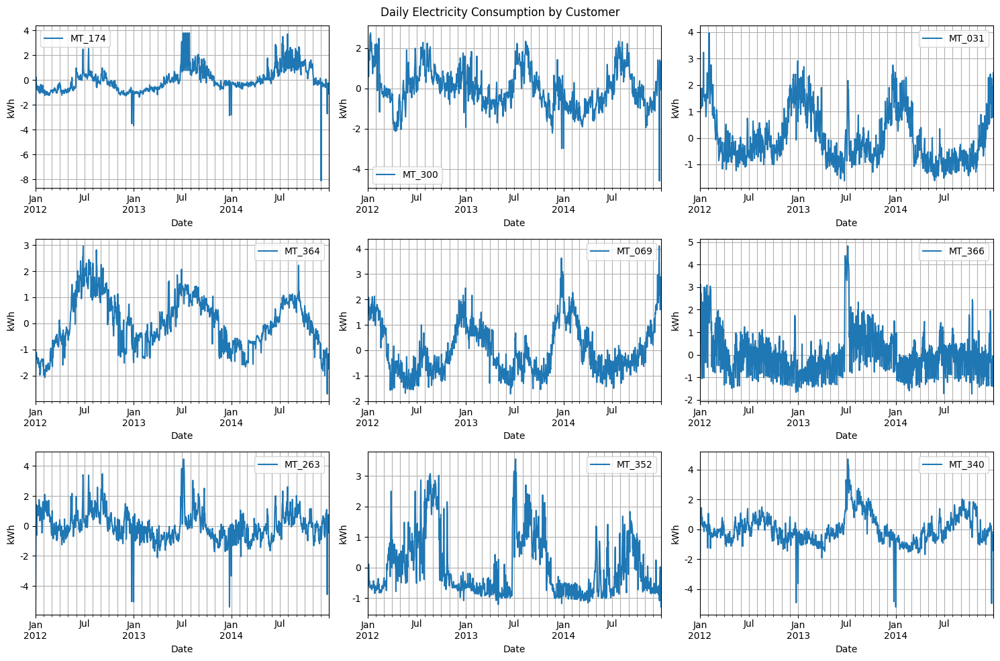

In [99]:
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,10))

axs = axs.flatten()

fig.suptitle('Daily Electricity Consumption by Customer')

sampled_customers = np.random.choice(normalized_daily_electricity_load_df.columns.values, size=len(axs), replace=False)

axs = axs.flatten()
for ax, customer in zip(axs, sampled_customers):
    normalized_daily_electricity_load_df[customer].dropna().plot(ax=ax, label=customer)
    make_axes_human_readable(ax)
    ax.set_xlabel('Date')
    ax.set_ylabel('kWh')
    ax.grid(True, which='both')
    ax.legend()

plt.tight_layout()
plt.show()

### KMedoids and DTW

I started here by using [DTW](https://rtavenar.github.io/blog/dtw.html) as the similarity measure and [k-medoids](https://www.geeksforgeeks.org/ml-k-medoids-clustering-with-example/) as the clustering algorithm.

#### Cluster

In [60]:
# Convert the DataFrame to a 2D numpy array where each row is a time series
# Drop the dates for which any of the consumers have to consumption.
normalized_daily_timeseries = normalized_daily_electricity_load_df.T.values
normalized_daily_timeseries = normalized_daily_timeseries.reshape((len(normalized_daily_timeseries), -1, 1))
print(normalized_daily_timeseries.shape)

(317, 1095, 1)


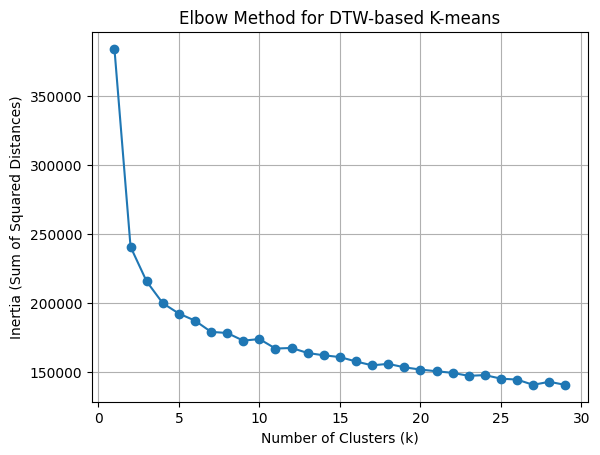

In [653]:
# Calculate the elbow function to how to choose the cluster size
inertias = []

ks = list(range(1, 30))

for k in ks:
    model = TimeSeriesKMedoids(n_clusters=k, metric='dtw', random_state=42)
    model.fit(normalized_daily_timeseries)
    inertias.append(model.inertia_)  # Store inertia (sum of squared distances)

# Plot the elbow curve
plt.plot(ks, inertias, marker='o')
plt.title("Elbow Method for DTW-based K-means")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.grid(True, which='both')
plt.show()

In [656]:
# Fit the model
K = 4
clustering_model = TimeSeriesKMedoids(n_clusters=K, metric='dtw', random_state=42)
cluster_labels = clustering_model.fit_predict(normalized_daily_timeseries)

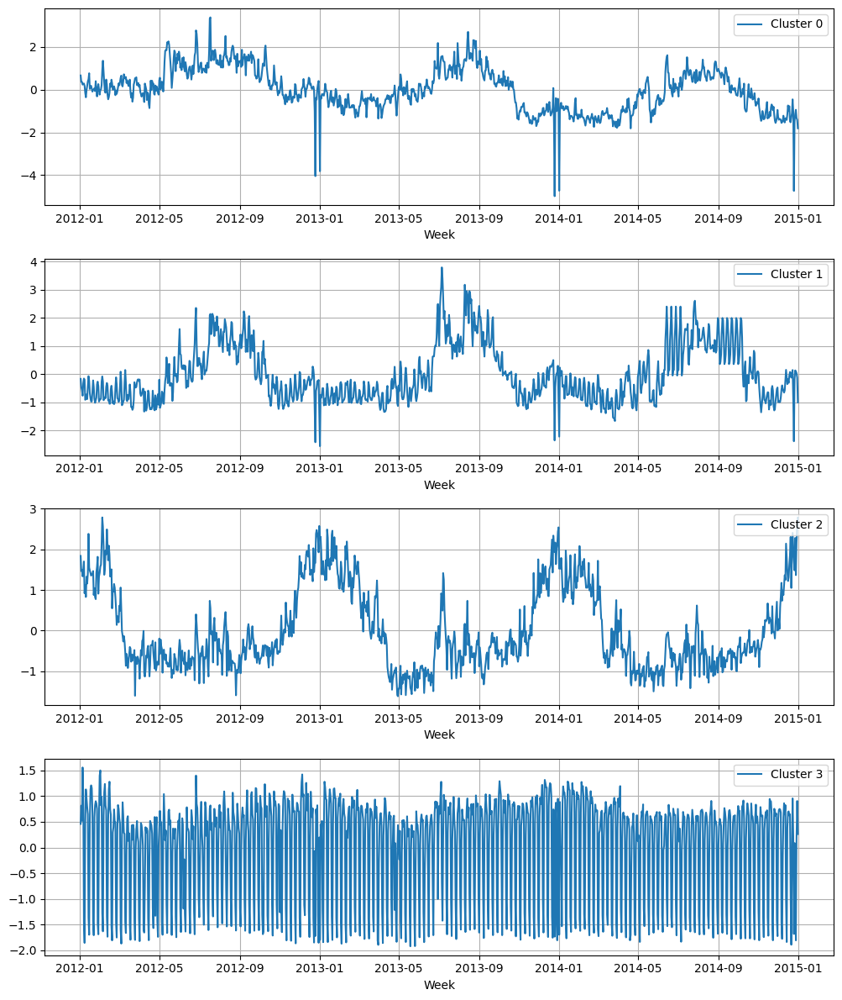

In [657]:
# Plot the medoids
timestamps = normalized_daily_electricity_load_df.index.values
medoids = clustering_model.cluster_centers_

fig, axs = plt.subplots(nrows=len(medoids), ncols=1, figsize=(10,12))

for i, (ax, medoid) in enumerate(zip(axs, medoids)):
    ax.plot(timestamps, medoid.ravel(), label=f'Cluster {i}')
    ax.set_xlabel('Week')
    ax.legend(loc='upper right')
    ax.grid(True, which='both')

plt.tight_layout()
plt.show()

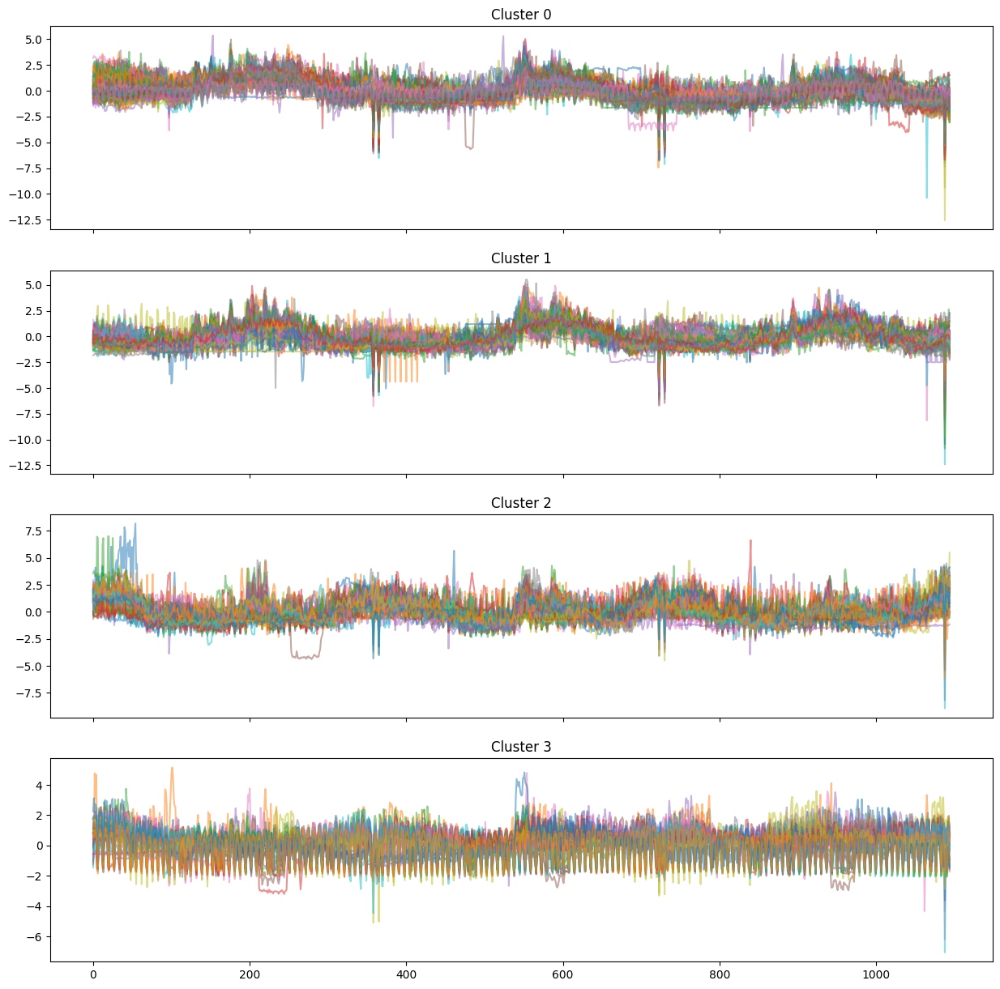

In [658]:
fig, axes = plt.subplots(K, 1, figsize=(15, 15), sharex=True)

for cluster in range(K):
    cluster_indices = np.where(cluster_labels == cluster)[0]
    
    for idx in cluster_indices:
        axes[cluster].plot(normalized_daily_electricity_load_df.T.values[idx].ravel(), alpha=0.5)
    
    axes[cluster].set_title(f"Cluster {cluster}")

plt.show()

In [376]:
sil_score = silhouette_score(normalized_daily_timeseries.reshape(len(normalized_daily_timeseries), -1), cluster_labels)
print(f"Silhouette Score: {sil_score:.3f}")

dbi = davies_bouldin_score(normalized_daily_timeseries.reshape(len(normalized_daily_timeseries), -1), cluster_labels)
print(f"Davies-Bouldin Index: {dbi:.3f}")

Silhouette Score: 0.140
Davies-Bouldin Index: 2.103


### KShape

See the [paper](https://www.paparrizos.org/papers/PaparrizosSIGMOD15.pdf).

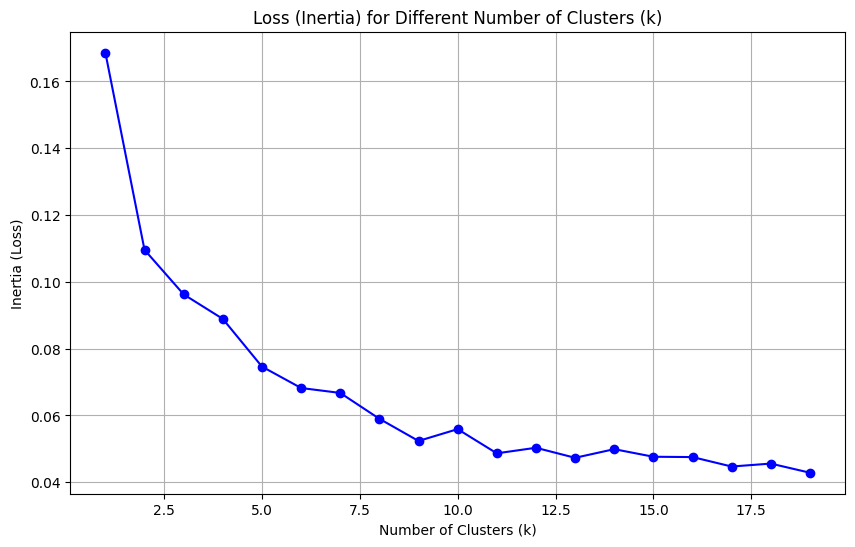

In [61]:
# Calculate the sum to get the total electricity per customer per day and format it appropriately
train_total_consumption = original_train_data2.sum(axis=0)
train_data = train_total_consumption.to_frame(name='y').reset_index()
train_data.columns = ['ds', 'y']

test_total_consumption = original_test_data2.sum(axis=0)
test_data = test_total_consumption.to_frame(name='y').reset_index()
test_data.columns = ['ds', 'y']

validation_total_consumption = original_validation_data2.sum(axis=0)
validation_data = validation_total_consumption.to_frame(name='y').reset_index()
validation_data.columns = ['ds', 'y']

In [84]:
num_clusters = 3

# Evaluate performance on validation data
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

# Get the cluster labels (which time series belong to which cluster)
cluster_labels = kshape.labels_

0.129 --> 0.111 --> 0.103 --> 0.101 --> 0.100 --> 0.099 --> 0.099 --> 0.098 --> 0.098 --> 0.098 --> 


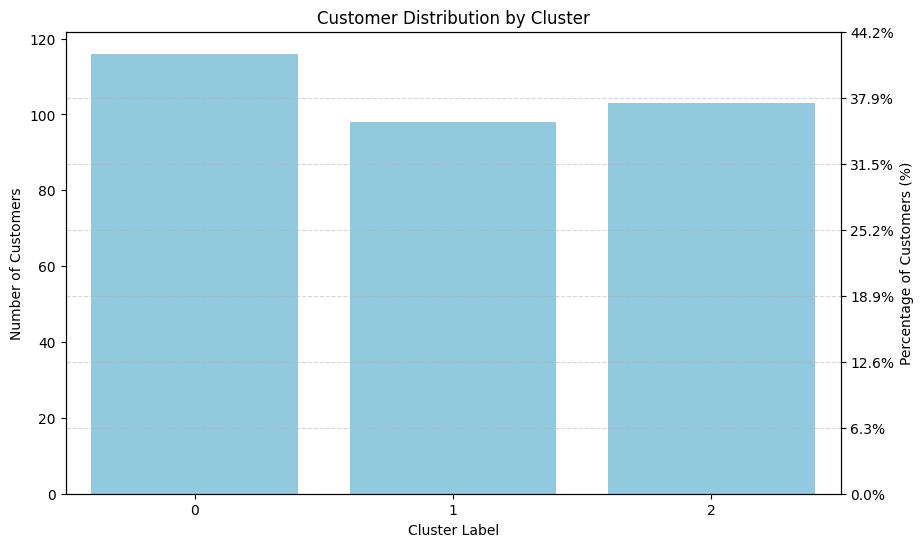

In [85]:
# Count the number of customers in each cluster
unique_clusters, counts = np.unique(cluster_labels, return_counts=True)

# Compute percentage of customers in each cluster
total_customers = len(cluster_labels)
percentages = (counts / total_customers) * 100

# Create figure and primary y-axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot bar chart for customer count (left y-axis)
sns.barplot(x=unique_clusters, y=counts, ax=ax1, color="skyblue")

# Label the left y-axis
ax1.set_ylabel("Number of Customers")
ax1.set_xlabel("Cluster Label")
ax1.set_xticks(unique_clusters)

# Create secondary y-axis (right) and align with left y-axis
ax2 = ax1.twinx()
ax2.set_ylim(ax1.get_ylim())  # Match the range of both axes

# Get tick positions from the left y-axis
y_ticks = ax1.get_yticks()

# Convert left y-axis ticks (absolute counts) to percentages
ax2.set_yticks(y_ticks)
ax2.set_yticklabels([f"{(tick/total_customers)*100:.1f}%" for tick in y_ticks])

# Label the right y-axis
ax2.set_ylabel("Percentage of Customers (%)")

# Title and layout
plt.title("Customer Distribution by Cluster")
plt.grid(axis='y', linestyle="--", alpha=0.5)  # Add horizontal grid lines for clarity
plt.show()



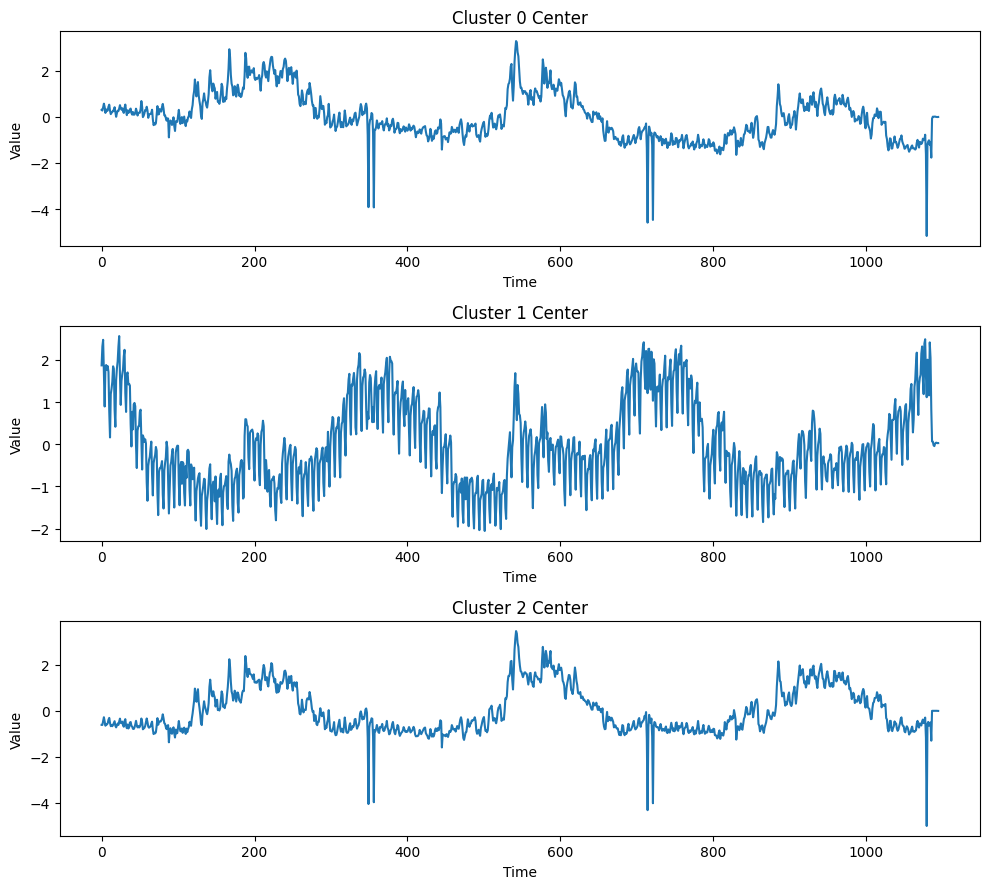

In [86]:
# Plot the cluster centers, each in its own axis
fig, axes = plt.subplots(num_clusters, 1, figsize=(10, 3 * num_clusters))

for cluster_idx in range(num_clusters):
    axes[cluster_idx].plot(kshape.cluster_centers_[cluster_idx].ravel())
    axes[cluster_idx].set_title(f"Cluster {cluster_idx} Center")
    axes[cluster_idx].set_xlabel("Time")
    axes[cluster_idx].set_ylabel("Value")

plt.tight_layout()
plt.show()

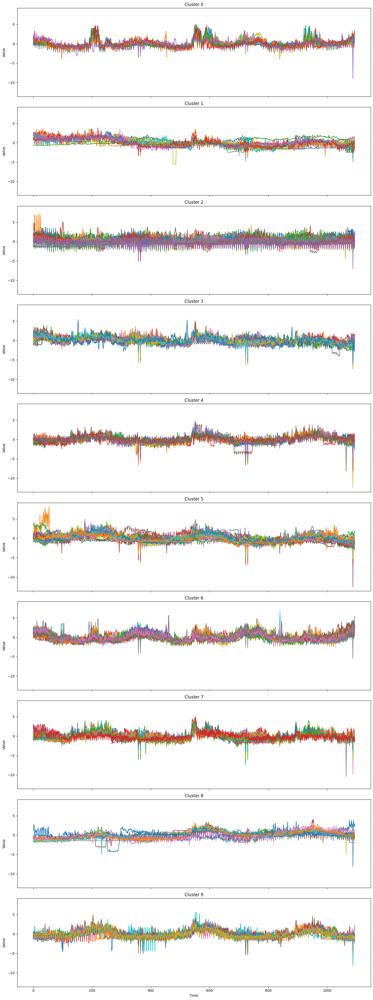

In [77]:
# Create subplots: one row per cluster
fig, axes = plt.subplots(num_clusters, 1, figsize=(15, 4 * num_clusters), sharex=True, sharey=True)

# Ensure 'axes' is iterable (if num_clusters = 1, it may be a single object)
if num_clusters == 1:
    axes = [axes]

# Loop through each cluster
for cluster in range(num_clusters):
    cluster_indices = np.where(cluster_labels == cluster)[0]  # Get indices of customers in this cluster

    for idx in cluster_indices:
        axes[cluster].plot(normalized_daily_timeseries[idx].ravel())  # Plot individual time series

    # Cluster title
    axes[cluster].set_title(f"Cluster {cluster}")
    axes[cluster].set_ylabel("Value")

# Global labels
plt.xlabel("Time")
# plt.suptitle("Electricity Load for Each Cluster", fontsize=14)
plt.tight_layout()
plt.show()

### DBSCAN + feature engineering

Here, we extract features for each customer and use this with DBCSCAN

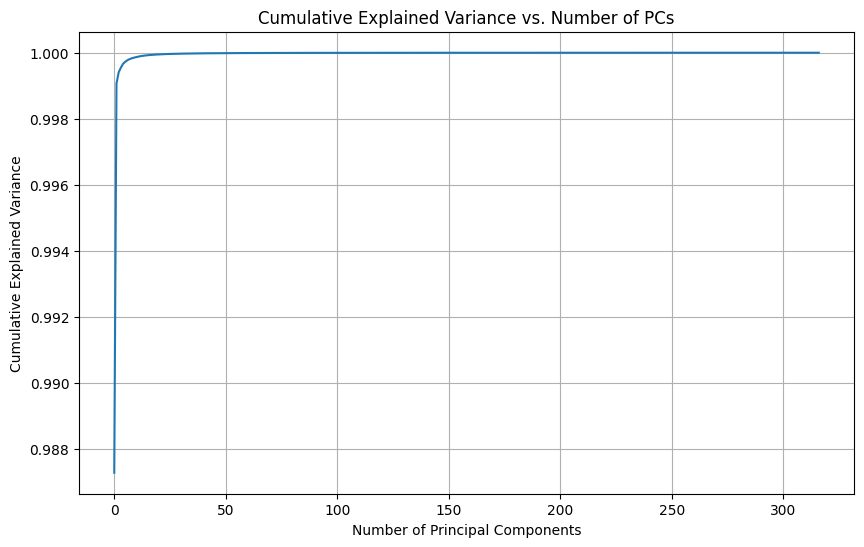

Number of PCs to explain 95% variance: 1


In [298]:
# Scale the data
scaler = StandardScaler()
scaled_timeseries = scaler.fit_transform(filtered_daily_electricity_load_df.T)

# Perform PCA
pca = PCA()
pca.fit(scaled_timeseries)

# Explained Variance Ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Cumulative Explained Variance
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot Cumulative Explained Variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs. Number of PCs')
plt.grid(True)
plt.show()

# Choose Number of PCs (Example: 90% Variance)
n_components_90 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Number of PCs to explain 95% variance: {n_components_90}")

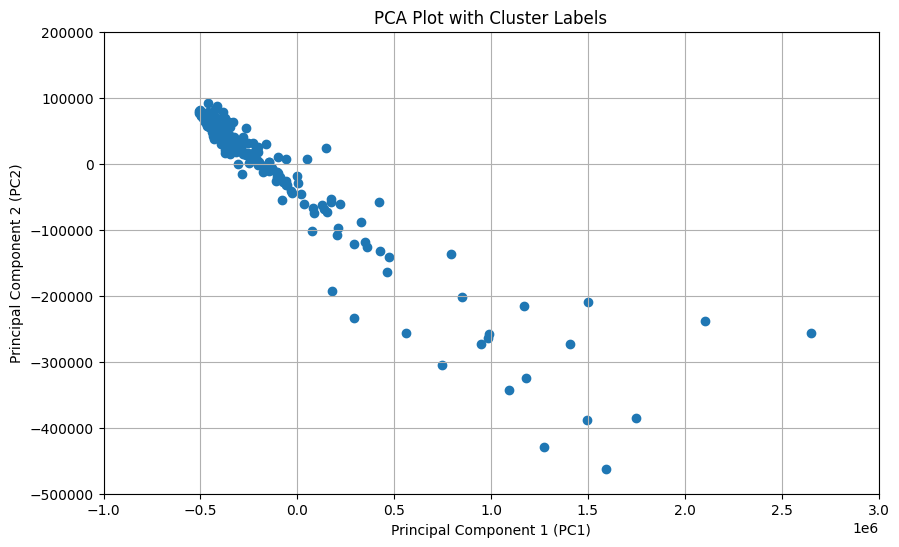

In [82]:
pca = PCA(n_components=2)  # Reduce to 2 components for 2D plotting
principal_components = pca.fit_transform(filtered_daily_electricity_load_df.T)

# Create DataFrame from Principal Components
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=filtered_daily_electricity_load_df.T.index)

# Create Scatter Plot
plt.figure(figsize=(10, 6))
ax = plt.scatter(pc_df['PC1'], pc_df['PC2'])  # Color by cluster labels
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.title('PCA Plot with Cluster Labels')
plt.xlim(-0.1e7, 0.3e7)
plt.ylim(-0.5e6, 0.2e6)
plt.grid(True)
plt.show()

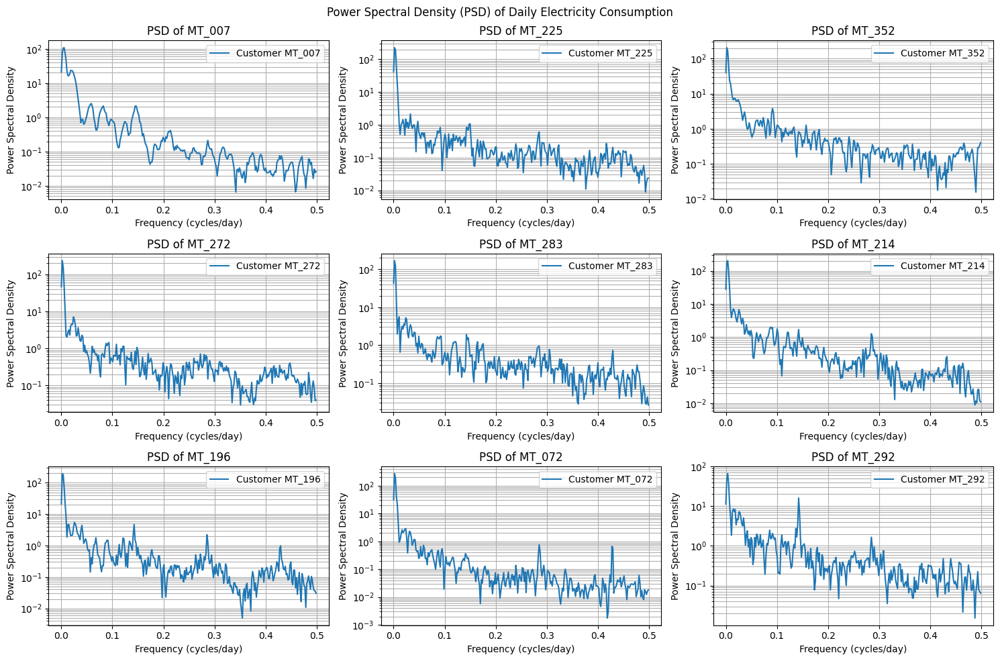

In [934]:
# Define a function to compute and plot the PSD
def plot_psd(ax, series, customer):
    fs = 1  # Assuming daily data, sampling frequency is 1 per day
    freqs, psd = welch(series.dropna(), fs=fs, nperseg=len(series)//2)  # Compute PSD
    
    ax.plot(freqs, psd, label=f"Customer {customer}")
    ax.set_xlabel("Frequency (cycles/day)")
    ax.set_ylabel("Power Spectral Density")
    ax.set_title(f"PSD of {customer}")
    ax.set_yscale("log")  # Log scale for better visualization
    ax.grid(True, which="both")
    ax.legend()

# Generate the figure with subplots
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
axs = axs.flatten()

fig.suptitle("Power Spectral Density (PSD) of Daily Electricity Consumption")

# Randomly select customers to plot
sampled_customers = np.random.choice(normalized_daily_electricity_load_df.columns.values, size=len(axs), replace=False)

# Loop through selected customers and plot their PSD
for ax, customer in zip(axs, sampled_customers):
    plot_psd(ax, normalized_daily_electricity_load_df[customer], customer)

plt.tight_layout()
plt.show()


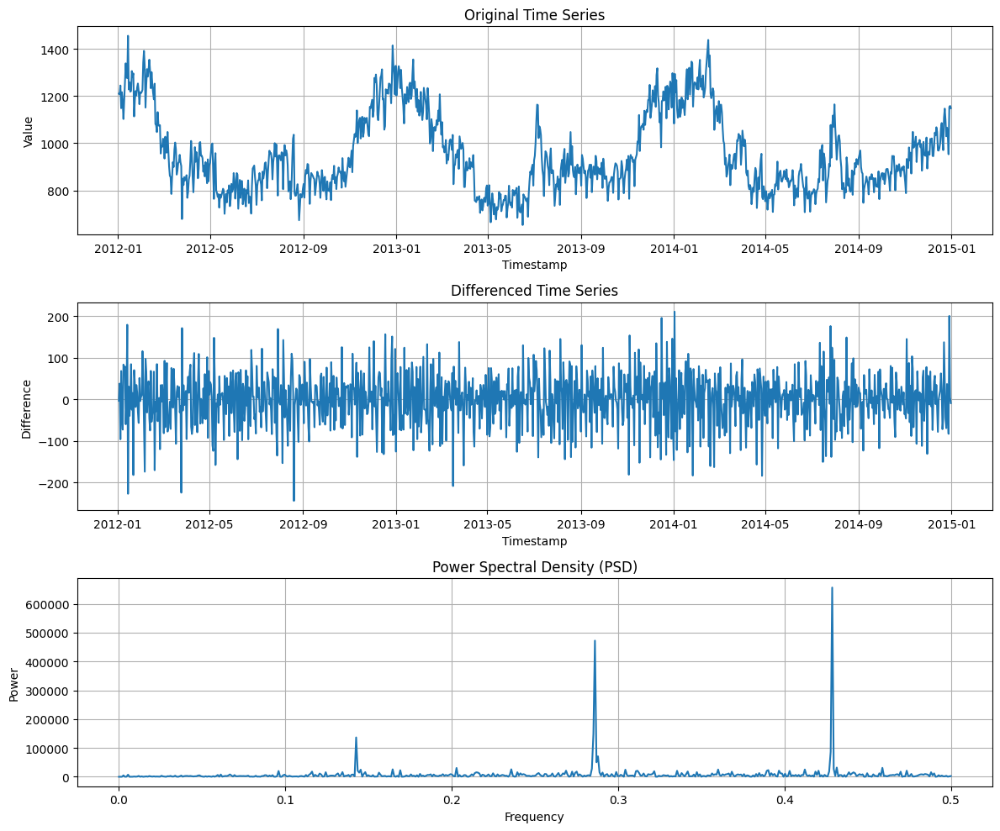


Top 5 Frequencies (Hz):
Frequency: 0.4287, Power: 656390.2255
Frequency: 0.2861, Power: 472215.4749
Frequency: 0.2852, Power: 149182.7377
Frequency: 0.1426, Power: 136456.8057
Frequency: 0.4278, Power: 86796.3343


In [945]:
from scipy import signal

def plot_time_series_diff_psd(time_series):
    """
    Plots the original time series, its differenced version, and the PSD.

    Args:
        time_series (pd.Series): Time series data with timestamps as index.
    """

    # 1. Calculate the differenced time series
    diff_series = time_series.diff().dropna()

    # 2. Calculate the PSD (Power Spectral Density)
    frequencies, psd = signal.periodogram(diff_series.values)

    # 3. Create subplots
    fig, axes = plt.subplots(3, 1, figsize=(12, 10))

    # 4. Plot the original time series
    axes[0].plot(time_series)
    axes[0].set_title("Original Time Series")
    axes[0].set_xlabel("Timestamp")
    axes[0].set_ylabel("Value")
    axes[0].grid(True)

    # 5. Plot the differenced time series
    axes[1].plot(diff_series)
    axes[1].set_title("Differenced Time Series")
    axes[1].set_xlabel("Timestamp")
    axes[1].set_ylabel("Difference")
    axes[1].grid(True)

    # 6. Plot the PSD
    axes[2].plot(frequencies, psd)
    axes[2].set_title("Power Spectral Density (PSD)")
    axes[2].set_xlabel("Frequency")
    axes[2].set_ylabel("Power")
    axes[2].grid(True)

    plt.tight_layout()
    plt.show()

     # 7. Print the top 5 frequencies
    top_5_indices = np.argsort(psd)[::-1][:5]
    top_5_frequencies = frequencies[top_5_indices]
    top_5_powers = psd[top_5_indices]

    print("\nTop 5 Frequencies (Hz):")
    for i in range(5):
        print(f"Frequency: {top_5_frequencies[i]:.4f}, Power: {top_5_powers[i]:.4f}")

plot_time_series_diff_psd(filtered_daily_electricity_load_df['MT_011'])

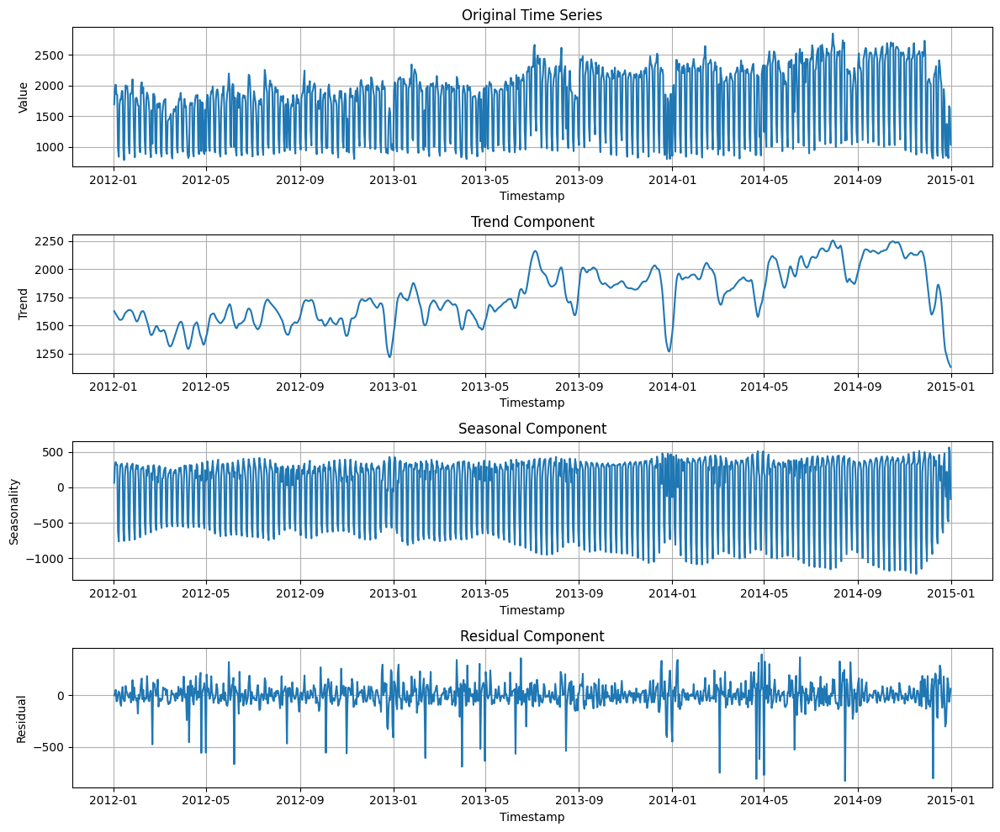

In [949]:
from statsmodels.tsa.seasonal import STL

def plot_stl_decomposition(time_series, period=None):
    """
    Decomposes a time series using STL and plots the original series and its components.

    Args:
        time_series (pd.Series): Time series data with timestamps as index.
        period (int, optional): The seasonal period. If None, it will be inferred.
    """

    # Perform STL decomposition
    stl = STL(time_series, period=period)
    result = stl.fit()

    # Create subplots
    fig, axes = plt.subplots(4, 1, figsize=(12, 10))

    # Plot the original time series
    axes[0].plot(time_series)
    axes[0].set_title("Original Time Series")
    axes[0].set_xlabel("Timestamp")
    axes[0].set_ylabel("Value")
    axes[0].grid(True)

    # Plot the trend component
    axes[1].plot(result.trend)
    axes[1].set_title("Trend Component")
    axes[1].set_xlabel("Timestamp")
    axes[1].set_ylabel("Trend")
    axes[1].grid(True)

    # Plot the seasonal component
    axes[2].plot(result.seasonal)
    axes[2].set_title("Seasonal Component")
    axes[2].set_xlabel("Timestamp")
    axes[2].set_ylabel("Seasonality")
    axes[2].grid(True)

    # Plot the residual component
    axes[3].plot(result.resid)
    axes[3].set_title("Residual Component")
    axes[3].set_xlabel("Timestamp")
    axes[3].set_ylabel("Residual")
    axes[3].grid(True)

    plt.tight_layout()
    plt.show()

plot_stl_decomposition(filtered_daily_electricity_load_df['MT_013'])

In [923]:
def extract_frequencies(customer_series):
    # Compute the FFT of the time series
    fft_values = np.fft.fft(customer_series.values)
    
    # Get the magnitudes of the FFT (abs gives the magnitude of the complex numbers)
    fft_magnitude = np.abs(fft_values)
    
    # Only consider the positive frequencies (half of the FFT array)
    fft_magnitude = fft_magnitude[1:len(fft_magnitude) // 2]
    
    # Get the frequencies corresponding to the FFT bins
    freqs = np.fft.fftfreq(len(customer_series), d=1)[1:len(fft_magnitude) + 1]  # Assuming 1-day sampling period

    # Get the indices of the frequencies sorted by magnitude (highest first)
    sorted_freq_indices = np.argsort(fft_magnitude)[::-1]

    return freqs[sorted_freq_indices]

customer_freqs_df = filtered_daily_electricity_load_df.apply(extract_frequencies, axis=0).T

(317, 546)


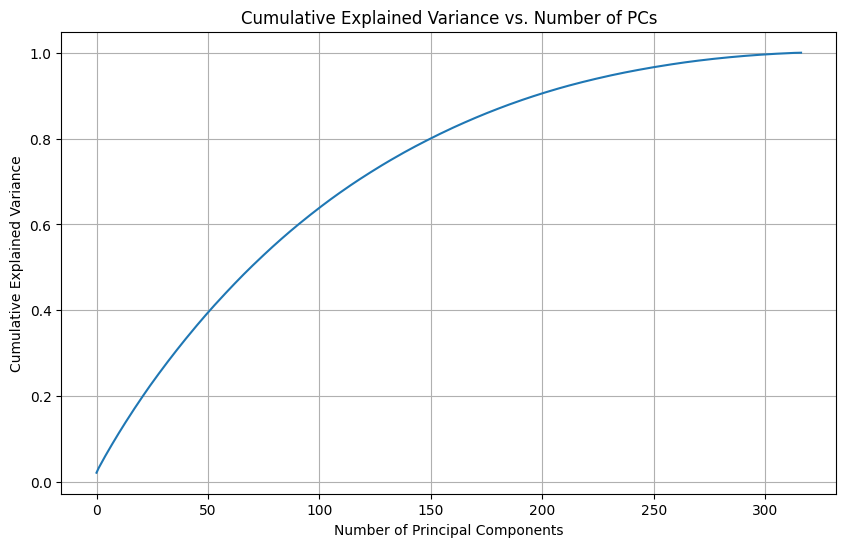

Number of PCs to explain 99% variance: 286


In [930]:
# Scale the data
scaler = StandardScaler()
scaled_timeseries = scaler.fit_transform(customer_freqs_df)

print(scaled_timeseries.shape)

# Perform PCA
pca = PCA()
pca.fit(scaled_timeseries)

# Explained Variance Ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Cumulative Explained Variance
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot Cumulative Explained Variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs. Number of PCs')
plt.grid(True)
plt.show()

# Choose Number of PCs (Example: 90% Variance)
n_components_90 = np.argmax(cumulative_variance >= 0.99) + 1
print(f"Number of PCs to explain 99% variance: {n_components_90}")

In [932]:
def extract_top_frequencies(customer_series, n=3):
    # Compute the FFT of the time series
    fft_values = np.fft.fft(customer_series.values)
    
    # Get the magnitudes of the FFT (abs gives the magnitude of the complex numbers)
    fft_magnitude = np.abs(fft_values)
    
    # Only consider the positive frequencies (half of the FFT array)
    fft_magnitude = fft_magnitude[:len(fft_magnitude) // 2]
    
    # Get the frequencies corresponding to the FFT bins
    freqs = np.fft.fftfreq(len(customer_series), d=1)[1:len(fft_magnitude)]  # Assuming 1-day sampling period
    
    # Get the indices of the top 3 frequencies with the highest magnitudes
    top_n_freq_indices = np.argsort(fft_magnitude)[-n:][::-1]
    
    # Extract the top 3 dominant frequencies and their magnitudes
    top_n_frequencies = freqs[top_n_freq_indices]
    top_n_magnitudes = fft_magnitude[top_n_freq_indices]
    
    return top_n_frequencies, top_n_magnitudes

def extract_features(customer_series):
    max_day_of_week = customer_series.groupby(s.index.dayofweek).mean().idxmax()
    max_month = customer_series.groupby(s.index.month).mean().idxmax()
    
    top_freqs, top_n_magnitudes = extract_top_frequencies(customer_series, 4)

    features = {
        'max_day_of_week': max_day_of_week,
        'max_month': max_month,
        'freq_1': (1 / top_freqs[1]).round(),
        'freq_2': (1 / top_freqs[2]).round(),
        'freq_3': (1 / top_freqs[3]).round(),
    }
    return features

customer_features = pd.DataFrame(filtered_daily_electricity_load_df.apply(extract_features, axis=0).to_dict()).T

pca = PCA(n_components=2)
principal_components = pca.fit_transform(filtered_daily_electricity_load_df.T)

customer_features['pc_1'] = principal_components[:,0]
customer_features['pc_2'] = principal_components[:,1]
customer_features

,max_day_of_week,max_month,freq_1,freq_2,freq_3,pc_1,pc_2
MT_001,2.0,9.0,365.0,219.0,137.0,-505885.837495,79169.392385
MT_002,5.0,7.0,274.0,156.0,548.0,-488562.971906,75132.091144
MT_003,5.0,2.0,274.0,548.0,219.0,-507473.283762,77583.823429
MT_004,5.0,12.0,274.0,548.0,156.0,-429395.283804,47450.852259
MT_005,1.0,12.0,274.0,156.0,548.0,-474068.441477,63252.528308
...,...,...,...,...,...,...,...
MT_365,1.0,7.0,274.0,548.0,156.0,-440223.303960,69671.226541
MT_366,4.0,7.0,365.0,2.0,219.0,-500335.788449,77906.051071
MT_367,4.0,7.0,274.0,7.0,365.0,-72646.481914,-27776.039468
MT_368,1.0,1.0,7.0,3.0,7.0,-414839.270061,48260.480737


<Axes: xlabel='timestamp'>

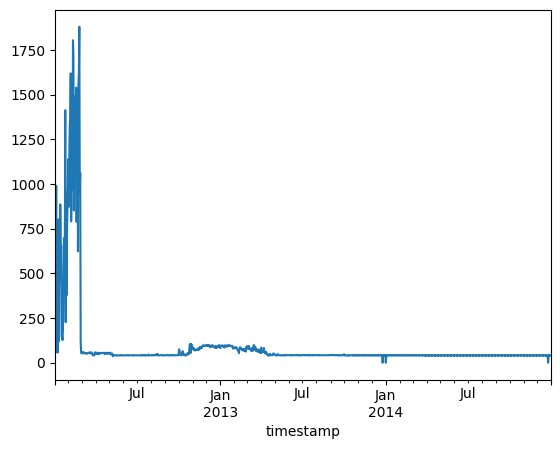

In [473]:
filtered_daily_electricity_load_df['MT_003'].plot()

--- Basic Statistics ---
       max_day_of_week   max_month      freq_1      freq_2      freq_3  \
count       317.000000  317.000000  317.000000  317.000000  317.000000   
mean          4.258675    7.375394  269.548896  270.397476  246.362776   
std           1.351029    3.009651  120.382703  181.345027  188.503679   
min           0.000000    1.000000    3.000000    2.000000    2.000000   
25%           4.000000    7.000000  274.000000  156.000000  110.000000   
50%           5.000000    8.000000  274.000000  156.000000  182.000000   
75%           5.000000    8.000000  274.000000  365.000000  365.000000   
max           6.000000   12.000000  548.000000  548.000000  548.000000   

               pc_1          pc_2  
count  3.170000e+02  3.170000e+02  
mean   4.700682e-11 -8.813778e-12  
std    2.622590e+06  2.729520e+05  
min   -5.074733e+05 -3.178934e+06  
25%   -4.547125e+05  1.263532e+04  
50%   -3.966275e+05  4.958921e+04  
75%   -2.297952e+05  6.456362e+04  
max    4.202952e+07 

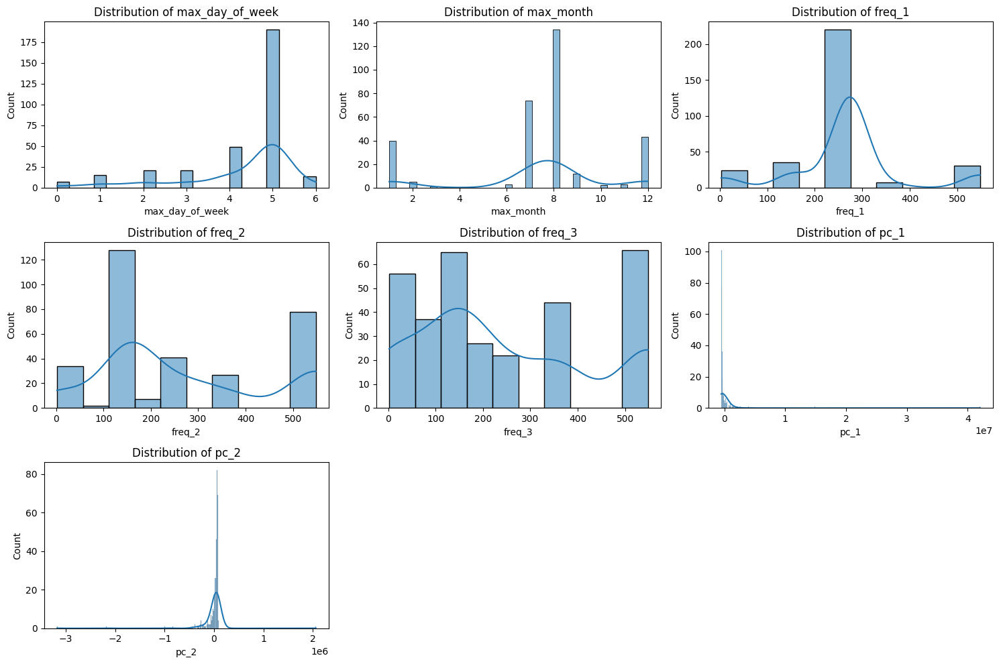

<Figure size 1500x1000 with 0 Axes>

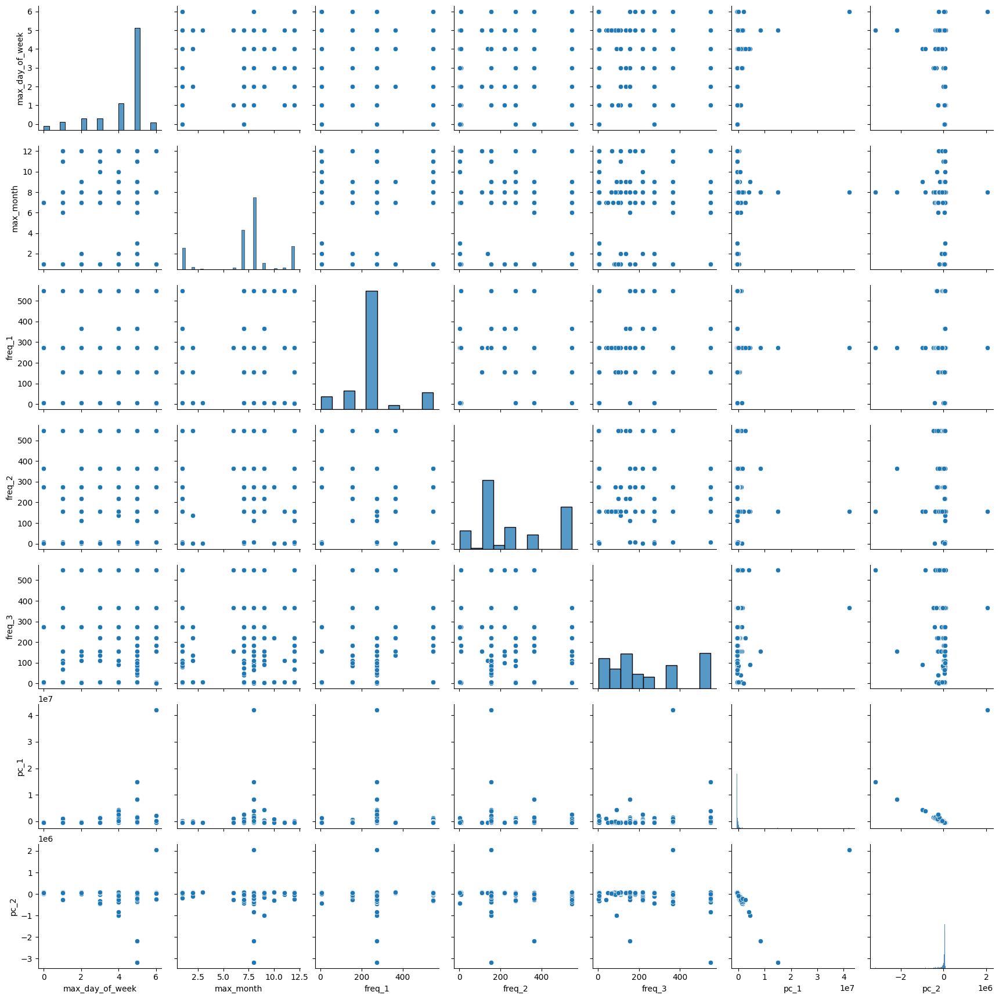


--- Correlation Matrix ---


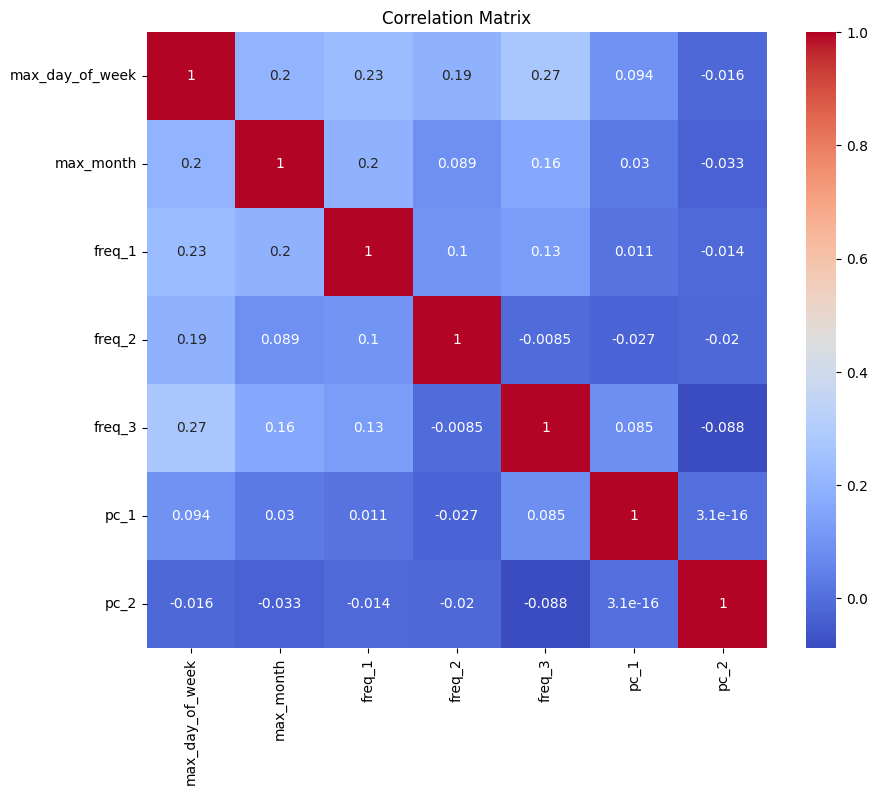


--- Variance Inflation Factor (VIF) ---
   VIF Factor         features
0    9.489036  max_day_of_week
1    6.493730        max_month
2    5.978715           freq_1
3    3.288429           freq_2
4    3.009378           freq_3
5    1.010035             pc_1
6    1.007489             pc_2


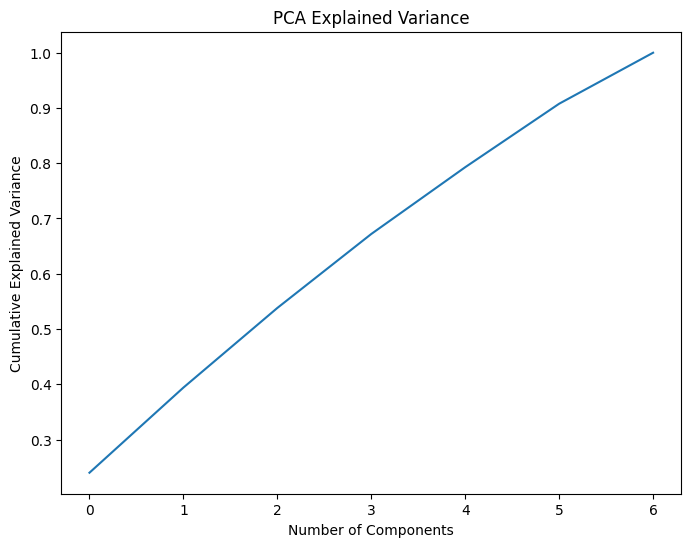

In [413]:
def evaluate_features(features_df, cluster_labels=None):
    """
    Compute Mean Absolute Percentage Error (MAPE)
    - Handles division by zero by replacing zeros with a small value (1e-10)
    - Ignores NaN values

    Args:
        y_true (array-like): Actual values
        y_pred (array-like): Predicted values

    Returns:
        float: MAPE percentage
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Replace zeros in y_true to avoid division by zero
    y_true = np.where(y_true == 0, 1e-10, y_true)

    # Compute MAPE
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return mape

# Calculate MAPE on validation data
mape = mean_absolute_percentage_error(validation_data['y'], val_forecast)

print(f"Validation MAPE: {mape}%")

Validation MAE: 34943.45
Validation RMSE: 37938.08


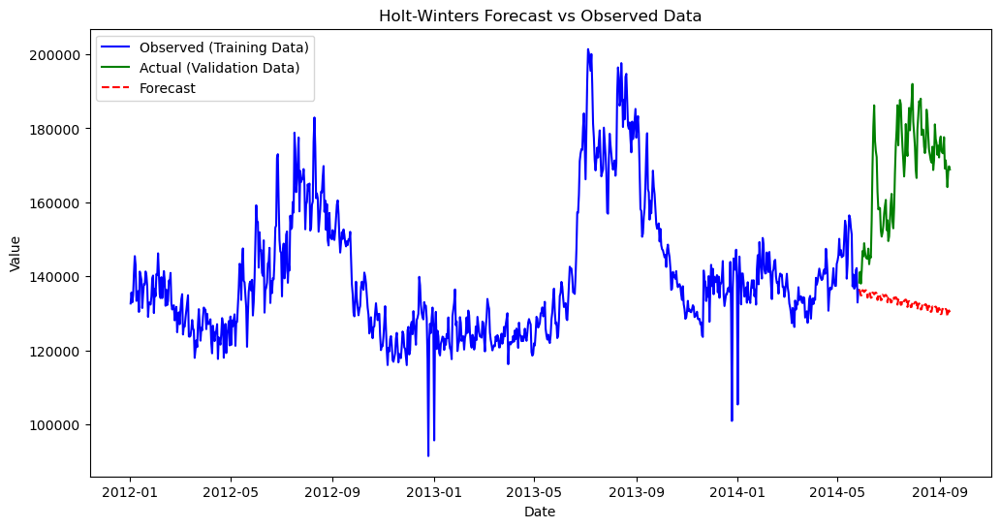

In [156]:
# Ensure the validation data's date column is in datetime format
validation_data['ds'] = pd.to_datetime(validation_data['ds'])
validation_data.set_index('ds', inplace=True)

# Ensure the forecast index is also in datetime format
forecast_index = pd.date_range(start=validation_data.index[0], periods=len(validation_data), freq='D')
val_forecast = pd.Series(val_forecast, index=forecast_index)  # Assign correct datetime index

# Evaluate model performance
mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

print(f"Validation MAE: {mae:.2f}")
print(f"Validation RMSE: {rmse:.2f}")

# Plot the results
plt.figure(figsize=(12, 6))

# Plot training data
plt.plot(series.index, series, label="Observed (Training Data)", color="blue")

# Plot validation (actual) data
plt.plot(validation_data.index, validation_data['y'], label="Actual (Validation Data)", color="green")

# Plot forecasted values
plt.plot(val_forecast.index, val_forecast, label="Forecast", color="red", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Value")
plt.title("Holt-Winters Forecast vs Observed Data")
plt.legend()
plt.show()

In [158]:
original_train_data3 = pd.read_parquet('dataset/cluster_3/training.parquet')
original_test_data3 = pd.read_parquet('dataset/cluster_3/test.parquet')
original_validation_data3 =  pd.read_parquet('dataset/cluster_3/validation.parquet')

In [160]:
# Calculate the sum to get the total electricity per customer per day and format it appropriately
train_total_consumption = original_train_data3.sum(axis=0)
train_data = train_total_consumption.to_frame(name='y').reset_index()
train_data.columns = ['ds', 'y']

test_total_consumption = original_test_data3.sum(axis=0)
test_data = test_total_consumption.to_frame(name='y').reset_index()
test_data.columns = ['ds', 'y']

validation_total_consumption = original_validation_data3.sum(axis=0)
validation_data = validation_total_consumption.to_frame(name='y').reset_index()
validation_data.columns = ['ds', 'y']

In [162]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import pandas as pd

# Ensure the date column is in datetime format
train_data['ds'] = pd.to_datetime(train_data['ds'])

# Set it as the index
train_data.set_index('ds', inplace=True)

# Extract the time series values
series = train_data['y']

# Fit the Holt-Winters model (Additive trend & seasonality)
model = ExponentialSmoothing(series, trend="add", seasonal="add", seasonal_periods=12)
fitted_model = model.fit()


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [497]:
eps_values = np.arange(1, 100, 0.5)  # Adjust ranges as needed
min_samples_values = range(2, 30)  # Adjust ranges as needed

scaler = StandardScaler()
scaled_features = scaler.fit_transform(customer_features)

# Store results that produce 4 clusters
four_cluster_results = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(scaled_features)
        unique_labels = np.unique(labels)
        num_clusters = len(unique_labels[unique_labels != -1]) #exlude noise

        if num_clusters in (4, 5, 6):
            four_cluster_results.append((eps, min_samples, labels, np.unique(labels[labels != 1]), (labels != 1).mean()))

In [503]:
srted = sorted(four_cluster_results, key=lambda x: x[-1], reverse=True)
best_labels = srted[3][2]

In [ ]:
# Create subplots: one row per cluster
num_clusters = len(np.unique(best_labels))
fig, axes = plt.subplots(num_clusters, 1, figsize=(15, 4 * num_clusters), sharex=True, sharey=True)

# Ensure 'axes' is iterable (if num_clusters = 1, it may be a single object)
if num_clusters == 1:
    axes = [axes]

# Loop through each cluster
for cluster in np.unique(best_labels):
    cluster_indices = np.where(best_labels == cluster)[0]  # Get indices of customers in this cluster

    for idx in cluster_indices:
        axes[cluster].plot(normalized_daily_timeseries[idx].ravel())  # Plot individual time series

    # Cluster title
    axes[cluster].set_title(f"Cluster {cluster}")
    axes[cluster].set_ylabel("Electricity Load")

# Global labels
plt.xlabel("Time")
plt.suptitle("Electricity Load for Each Cluster", fontsize=14)
plt.tight_layout()
plt.show()

### DBSCAN + PCA on PSA

### Combining approaches

In [660]:
def normalize_series(series: pd.Series):
    return (series - series.mean()) / series.std()

normalized_daily_electricity_load_df = filtered_daily_electricity_load_df.apply(normalize_series, axis=0)

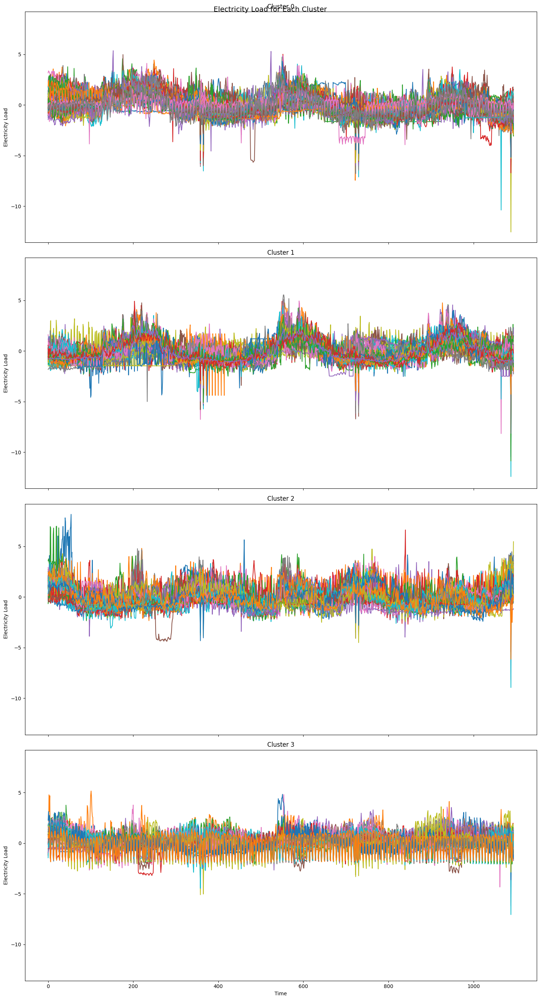

In [680]:
# Kmedois + DTW
num_clusters = 4
kmedois = TimeSeriesKMedoids(n_clusters=num_clusters, metric='dtw', random_state=42)
kmedoids_labels = kmedois.fit_predict(normalized_daily_timeseries)

# Create subplots: one row per cluster
fig, axes = plt.subplots(num_clusters, 1, figsize=(15, 7 * num_clusters), sharex=True, sharey=True)

# Ensure 'axes' is iterable (if num_clusters = 1, it may be a single object)
if num_clusters == 1:
    axes = [axes]

# Loop through each cluster
for cluster in np.unique(kmedoids_labels):
    cluster_indices = np.where(kmedoids_labels == cluster)[0]  # Get indices of customers in this cluster

    for idx in cluster_indices:
        axes[cluster].plot(normalized_daily_timeseries[idx].ravel())  # Plot individual time series

    # Cluster title
    axes[cluster].set_title(f"Cluster {cluster}")
    axes[cluster].set_ylabel("Electricity Load")

# Global labels
plt.xlabel("Time")
plt.suptitle("Electricity Load for Each Cluster", fontsize=14)
plt.tight_layout()
plt.show()

In [679]:
# Forecast for the validation period
val_forecast = fitted_model.forecast(steps=len(validation_data))

# Evaluate performance on validation data
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

print(f"Validation MAE: {mae:.2f}")
print(f"Validation RMSE: {rmse:.2f}")

# Define function for MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Compute Mean Absolute Percentage Error (MAPE)
    - Handles division by zero by replacing zeros with a small value (1e-10)
    - Ignores NaN values

    Args:
        y_true (array-like): Actual values
        y_pred (array-like): Predicted values

    Returns:
        float: MAPE percentage
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Replace zeros in y_true to avoid division by zero
    y_true = np.where(y_true == 0, 1e-10, y_true)

    # Compute MAPE
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return mape

# Calculate MAPE on validation data
mape = mean_absolute_percentage_error(validation_data['y'], val_forecast)

print(f"Validation MAPE: {mape}%")

Validation MAE: 11161.64
Validation RMSE: 13782.20
Validation MAPE: 6.339723310660224%


Validation MAE: 11161.64
Validation RMSE: 13782.20


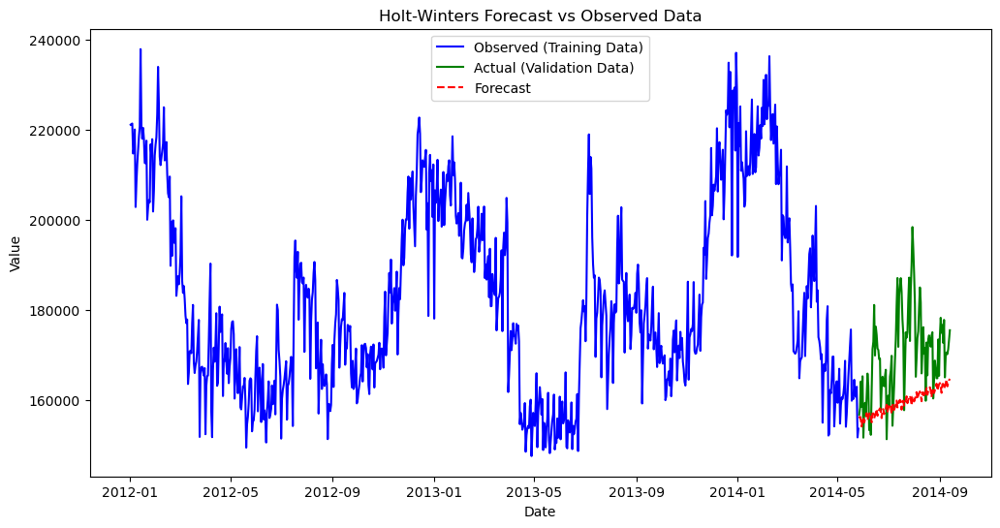

In [166]:
# Ensure the validation data's date column is in datetime format
validation_data['ds'] = pd.to_datetime(validation_data['ds'])
validation_data.set_index('ds', inplace=True)

# Ensure the forecast index is also in datetime format
forecast_index = pd.date_range(start=validation_data.index[0], periods=len(validation_data), freq='D')
val_forecast = pd.Series(val_forecast, index=forecast_index)  # Assign correct datetime index

# Evaluate model performance
mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

print(f"Validation MAE: {mae:.2f}")
print(f"Validation RMSE: {rmse:.2f}")

# Plot the results
plt.figure(figsize=(12, 6))

# Plot training data
plt.plot(series.index, series, label="Observed (Training Data)", color="blue")

# Plot validation (actual) data
plt.plot(validation_data.index, validation_data['y'], label="Actual (Validation Data)", color="green")

# Plot forecasted values
plt.plot(val_forecast.index, val_forecast, label="Forecast", color="red", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Value")
plt.title("Holt-Winters Forecast vs Observed Data")
plt.legend()
plt.show()

In [168]:
original_train_data4 = pd.read_parquet('dataset/cluster_4/training.parquet')
original_test_data4 = pd.read_parquet('dataset/cluster_4/test.parquet')
original_validation_data4 =  pd.read_parquet('dataset/cluster_4/validation.parquet')

In [170]:
# Calculate the sum to get the total electricity per customer per day and format it appropriately
train_total_consumption = original_train_data4.sum(axis=0)
train_data = train_total_consumption.to_frame(name='y').reset_index()
train_data.columns = ['ds', 'y']

test_total_consumption = original_test_data4.sum(axis=0)
test_data = test_total_consumption.to_frame(name='y').reset_index()
test_data.columns = ['ds', 'y']

validation_total_consumption = original_validation_data4.sum(axis=0)
validation_data = validation_total_consumption.to_frame(name='y').reset_index()
validation_data.columns = ['ds', 'y']

In [172]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import pandas as pd

# Ensure the date column is in datetime format
train_data['ds'] = pd.to_datetime(train_data['ds'])

# Set it as the index
train_data.set_index('ds', inplace=True)

# Extract the time series values
series = train_data['y']

# Fit the Holt-Winters model (Additive trend & seasonality)
model = ExponentialSmoothing(series, trend="add", seasonal="add", seasonal_periods=12)
fitted_model = model.fit()

# Forecast the next 12 periods
#forecast = fitted_model.forecast(steps=12)

# Display forecast results
#print(forecast)

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [174]:
# Forecast for the validation period
val_forecast = fitted_model.forecast(steps=len(validation_data))

# Evaluate performance on validation data
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

print(f"Validation MAE: {mae:.2f}")
print(f"Validation RMSE: {rmse:.2f}")


# Define function for MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Compute Mean Absolute Percentage Error (MAPE)
    - Handles division by zero by replacing zeros with a small value (1e-10)
    - Ignores NaN values

    Args:
        y_true (array-like): Actual values
        y_pred (array-like): Predicted values

    Returns:
        float: MAPE percentage
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Replace zeros in y_true to avoid division by zero
    y_true = np.where(y_true == 0, 1e-10, y_true)

    # Compute MAPE
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return mape

# Calculate MAPE on validation data
mape = mean_absolute_percentage_error(validation_data['y'], val_forecast)

print(f"Validation MAPE: {mape}%")

Validation MAE: 1258.79
Validation RMSE: 1458.61
Validation MAPE: 29.37598661331688%


Validation MAE: 1258.79
Validation RMSE: 1458.61


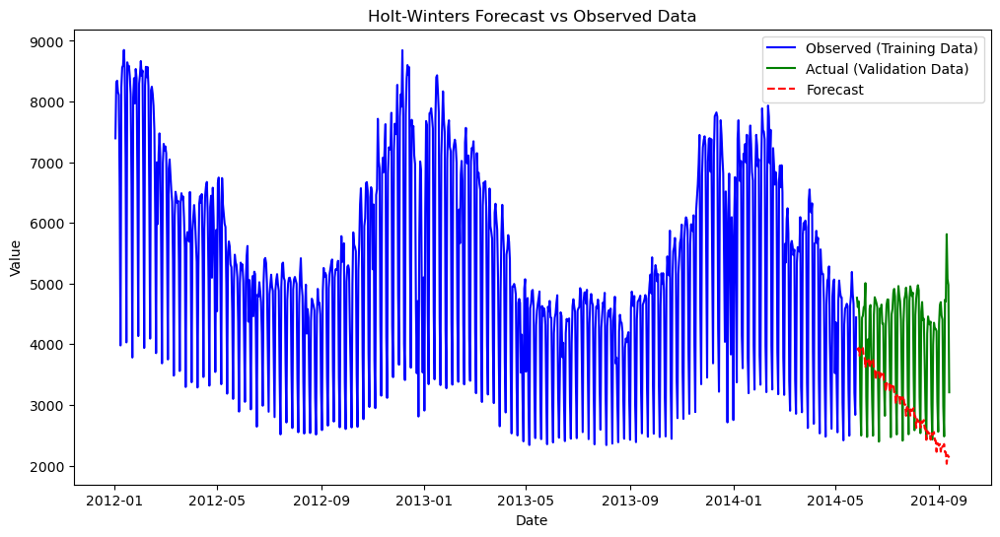

In [176]:
# Ensure the validation data's date column is in datetime format
validation_data['ds'] = pd.to_datetime(validation_data['ds'])
validation_data.set_index('ds', inplace=True)

# Ensure the forecast index is also in datetime format
forecast_index = pd.date_range(start=validation_data.index[0], periods=len(validation_data), freq='D')
val_forecast = pd.Series(val_forecast, index=forecast_index)  # Assign correct datetime index

# Evaluate model performance
mae = mean_absolute_error(validation_data['y'], val_forecast)
rmse = np.sqrt(mean_squared_error(validation_data['y'], val_forecast))

print(f"Validation MAE: {mae:.2f}")
print(f"Validation RMSE: {rmse:.2f}")

# Plot the results
plt.figure(figsize=(12, 6))

# Plot training data
plt.plot(series.index, series, label="Observed (Training Data)", color="blue")

# Plot validation (actual) data
plt.plot(validation_data.index, validation_data['y'], label="Actual (Validation Data)", color="green")

# Plot forecasted values
plt.plot(val_forecast.index, val_forecast, label="Forecast", color="red", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Value")
plt.title("Holt-Winters Forecast vs Observed Data")
plt.legend()
plt.show()

In [681]:
labels_df = pd.DataFrame(
    index=filtered_daily_electricity_load_df.columns,
    data={
        'kmedoids': kmedoids_labels,
        'kshape': kshape_labels,
        'dbscan': dbscan_labels
    }
)

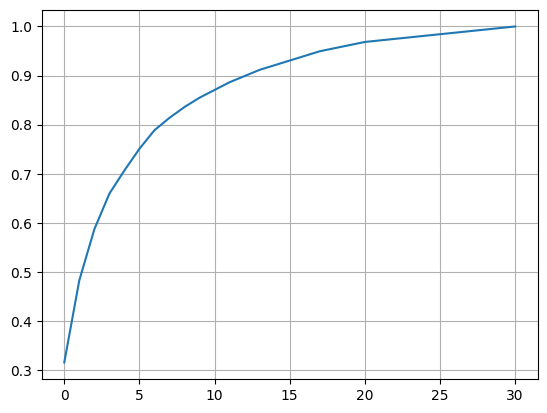

In [682]:
counts = labels_df.reset_index().groupby(by=['kshape', 'kmedoids', 'dbscan']).count().rename(columns={'index': 'counts'}).sort_values(by='counts', ascending=False)
cumulative = (counts.cumsum() / counts.sum()).values
plt.plot(range(len(cumulative)), cumulative)
plt.grid(True, which='both')

In [683]:
counts

counts
kshape kmedoids dbscan        
1      0         0         100
       1         0          53
0      2         0          33
       1         0          23
1      0         4          15
2      3        -1          14
0      2         2          12
1      0        -1           8
0      2        -1           7
2      3         3           6
                 2           5
                 0           5
0      1         4           4
2      2         2           4
1      2         1           3
       1        -1           3
2      2         0           3
                -1           3
0      2         1           2
       0         0           2
       2         4           2
2      1        -1           1
0      1        -1           1
       3        -1           1
1      3         0           1
       2         4           1
                 0           1
                -1           1
       0         2           1
                 1           1
0      0        -1           1

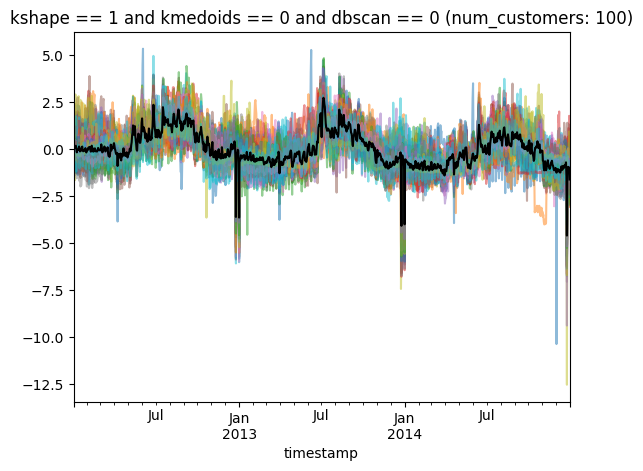

<Figure size 640x480 with 0 Axes>

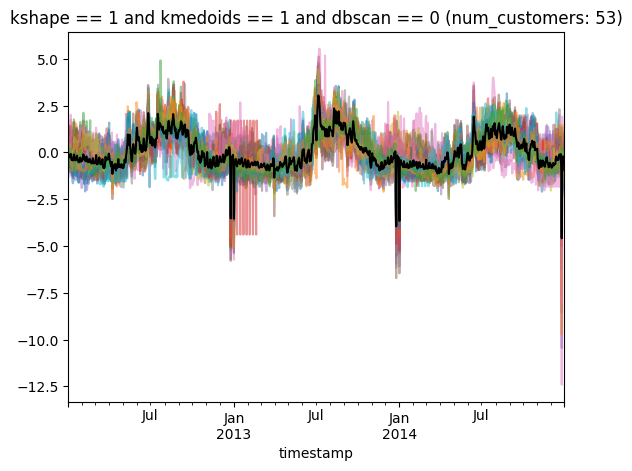

<Figure size 640x480 with 0 Axes>

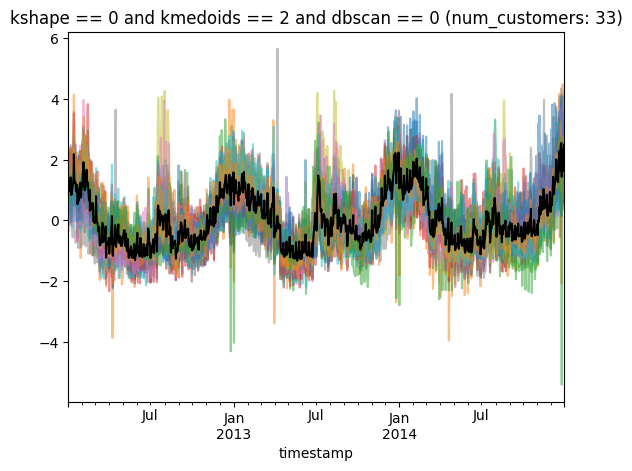

<Figure size 640x480 with 0 Axes>

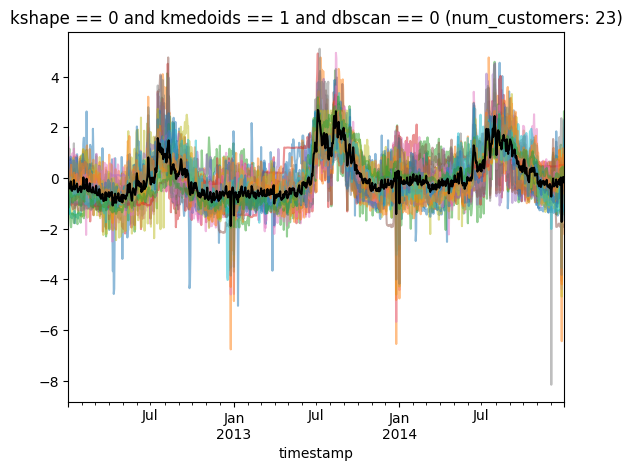

<Figure size 640x480 with 0 Axes>

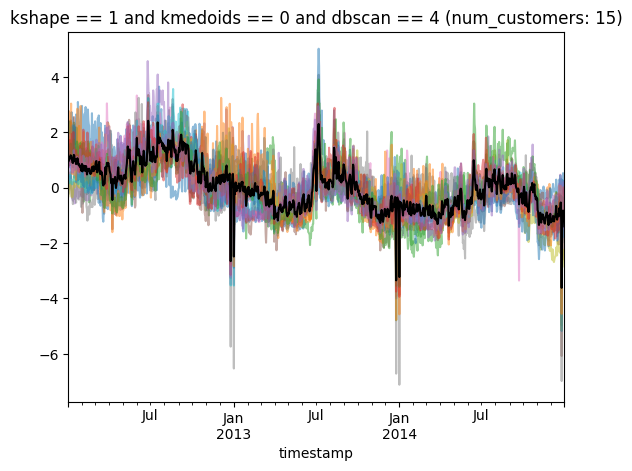

<Figure size 640x480 with 0 Axes>

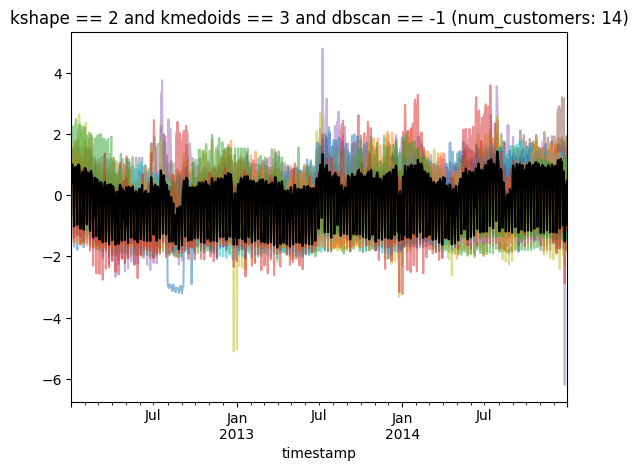

<Figure size 640x480 with 0 Axes>

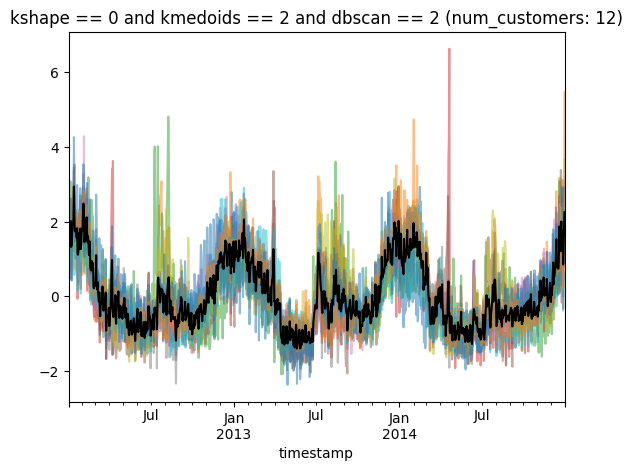

<Figure size 640x480 with 0 Axes>

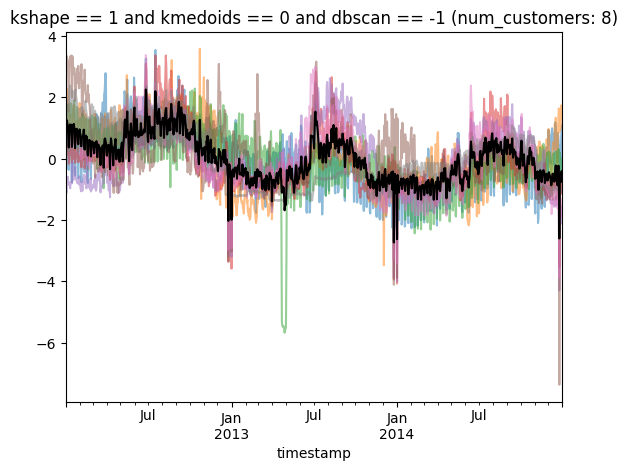

<Figure size 640x480 with 0 Axes>

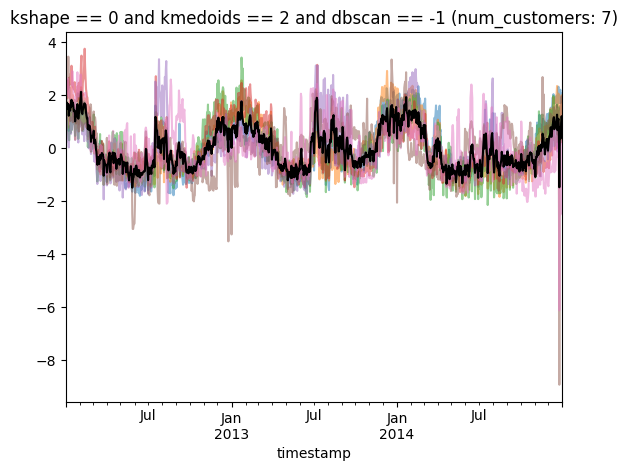

<Figure size 640x480 with 0 Axes>

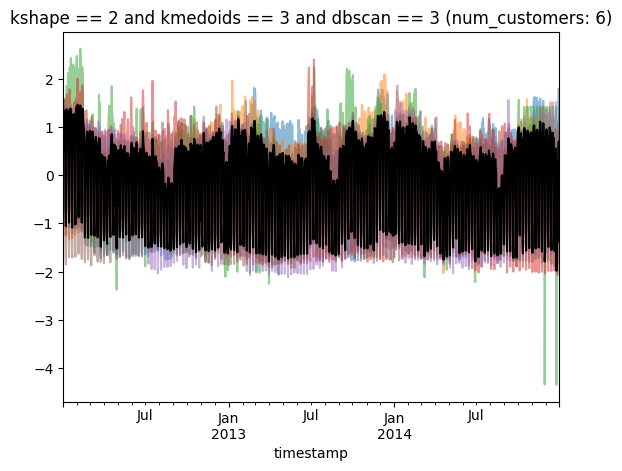

<Figure size 640x480 with 0 Axes>

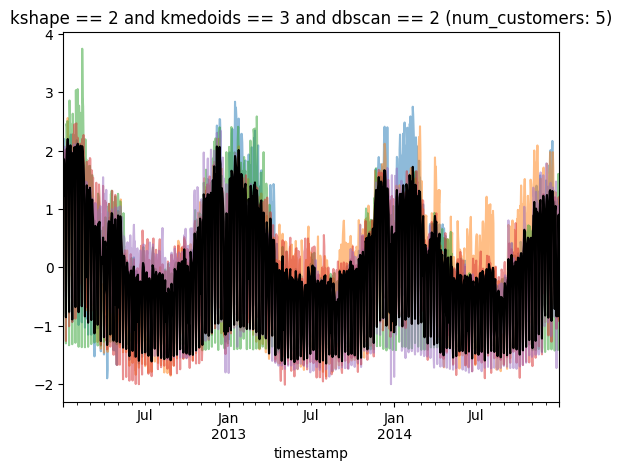

<Figure size 640x480 with 0 Axes>

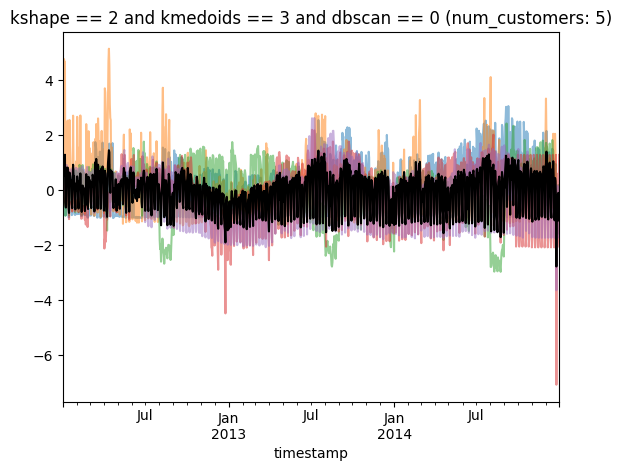

<Figure size 640x480 with 0 Axes>

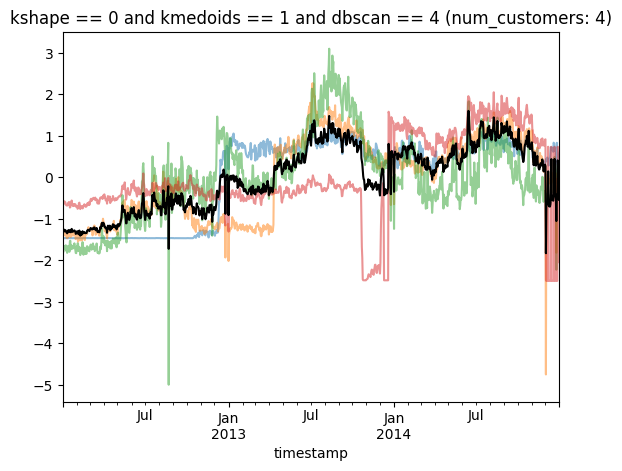

<Figure size 640x480 with 0 Axes>

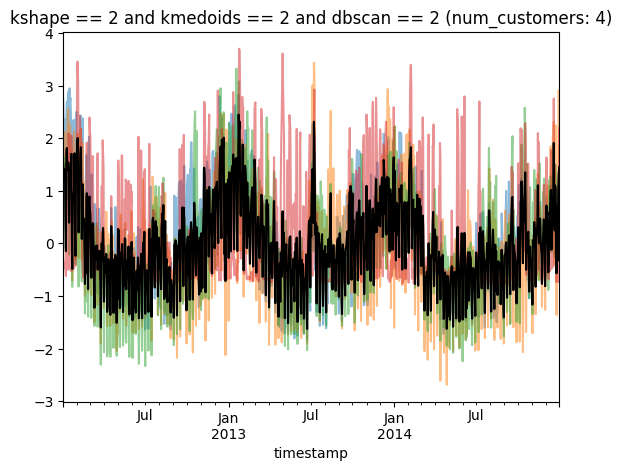

<Figure size 640x480 with 0 Axes>

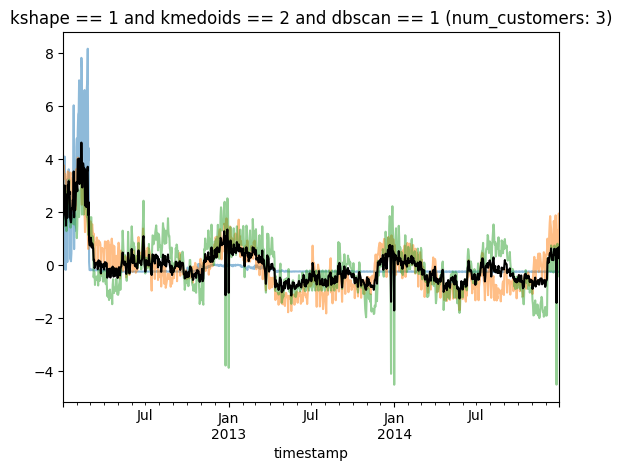

<Figure size 640x480 with 0 Axes>

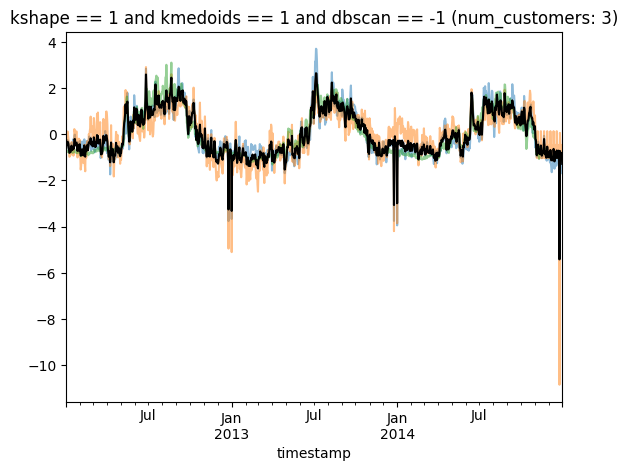

<Figure size 640x480 with 0 Axes>

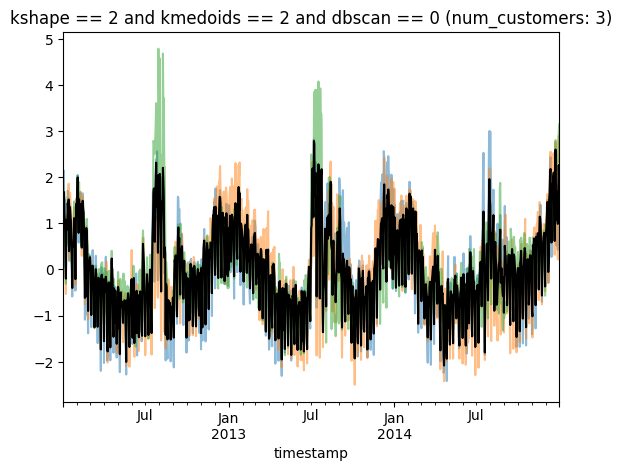

<Figure size 640x480 with 0 Axes>

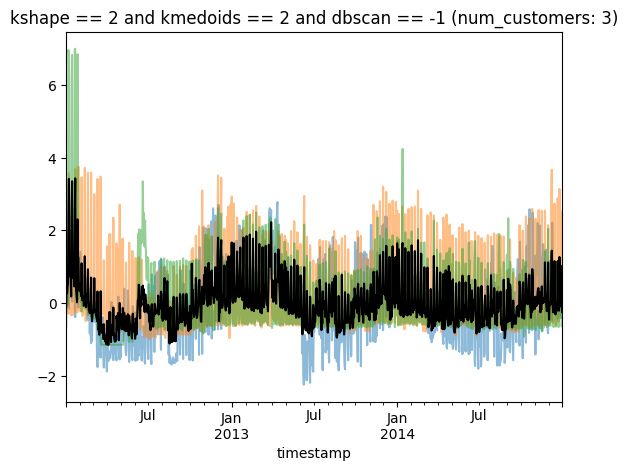

<Figure size 640x480 with 0 Axes>

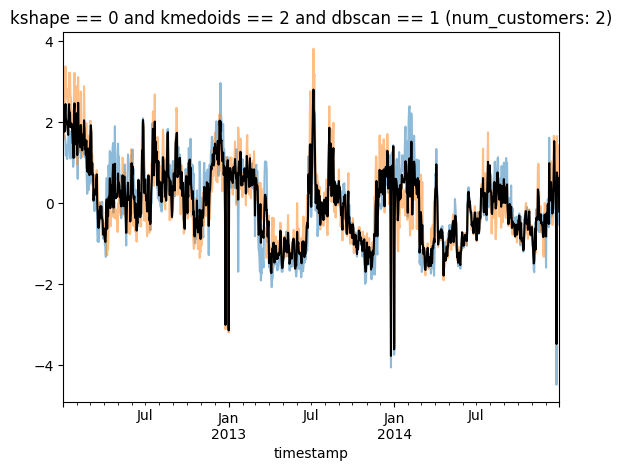

<Figure size 640x480 with 0 Axes>

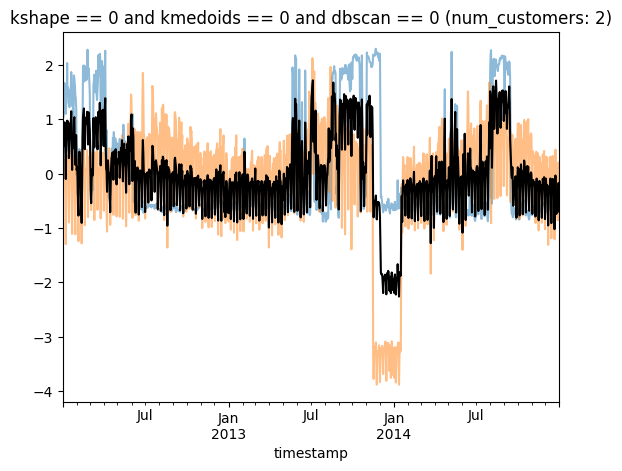

<Figure size 640x480 with 0 Axes>

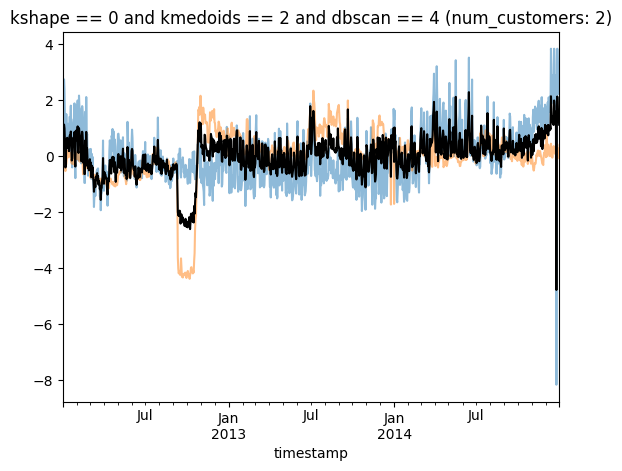

<Figure size 640x480 with 0 Axes>

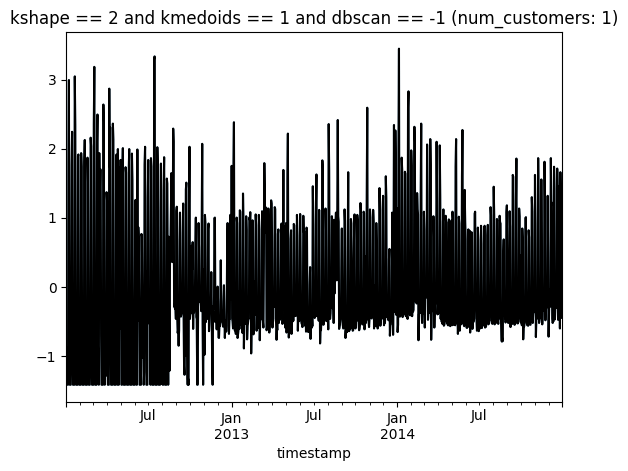

<Figure size 640x480 with 0 Axes>

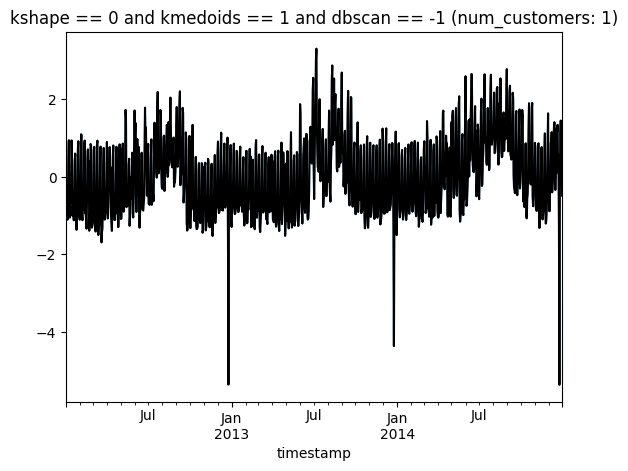

<Figure size 640x480 with 0 Axes>

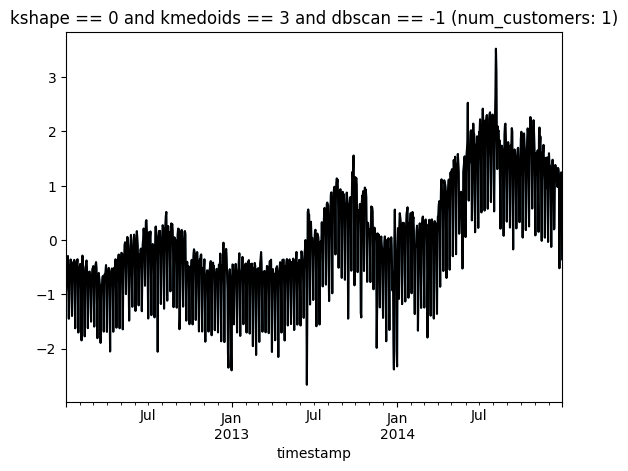

<Figure size 640x480 with 0 Axes>

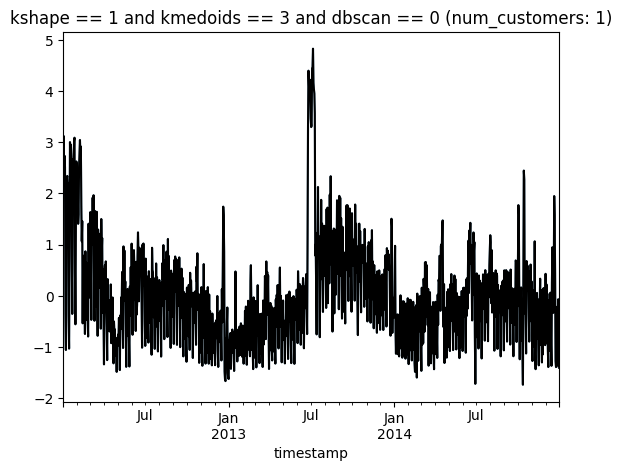

<Figure size 640x480 with 0 Axes>

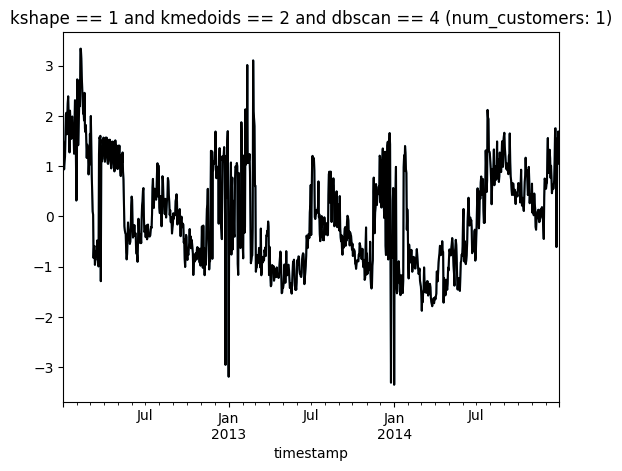

<Figure size 640x480 with 0 Axes>

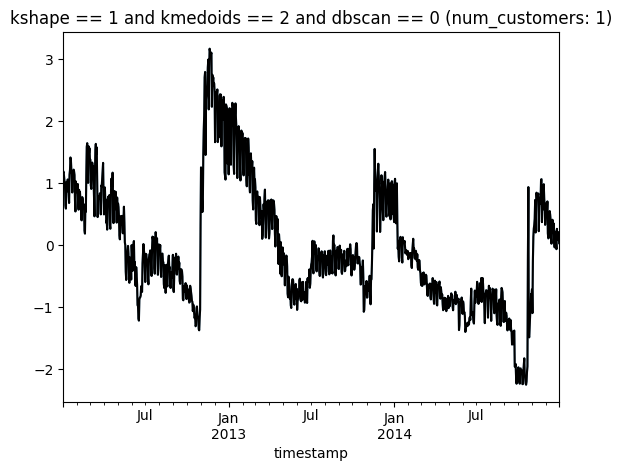

<Figure size 640x480 with 0 Axes>

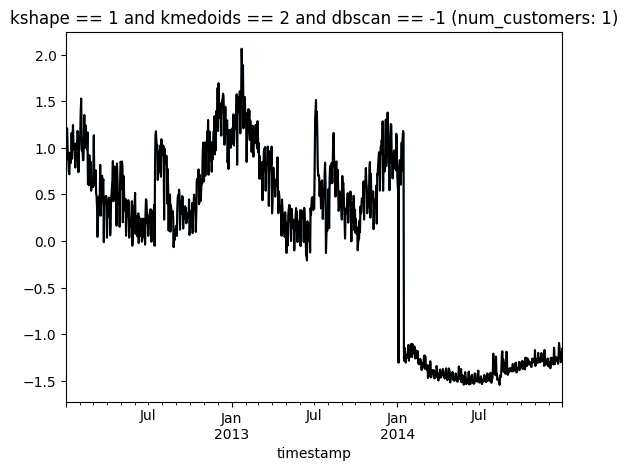

<Figure size 640x480 with 0 Axes>

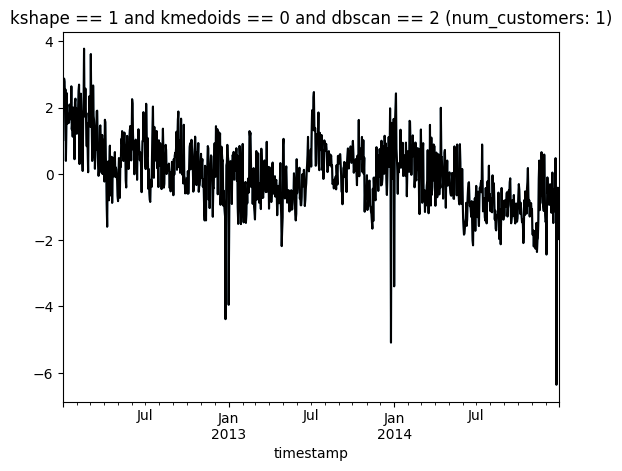

<Figure size 640x480 with 0 Axes>

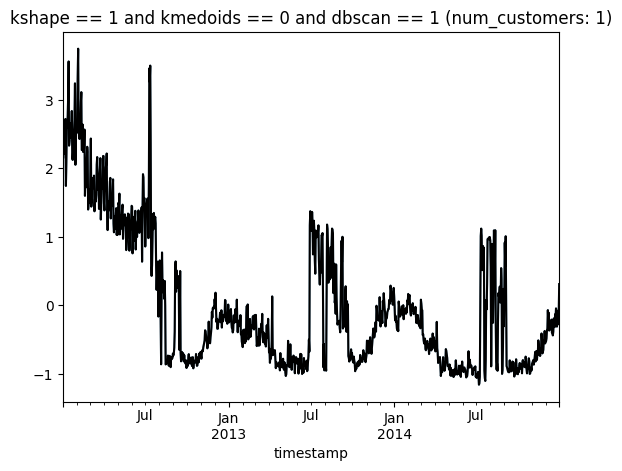

<Figure size 640x480 with 0 Axes>

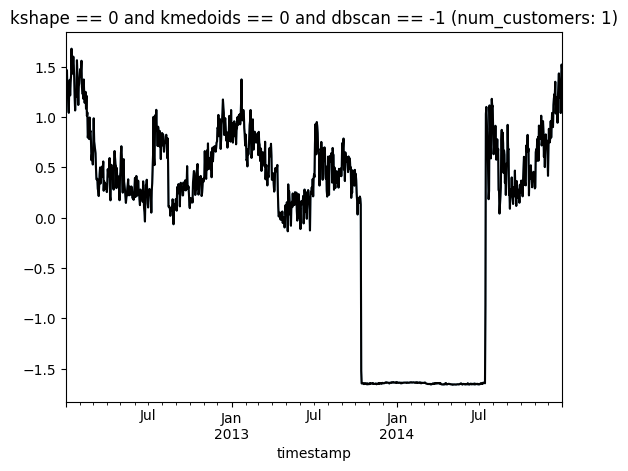

<Figure size 640x480 with 0 Axes>

In [720]:
for kshape_cluster, kmedoid_cluster, dbscan_cluster in counts.index:
    customers = labels_df.query(f'kshape == {kshape_cluster} and kmedoids == {kmedoid_cluster} and dbscan == {dbscan_cluster}').index.values
    filtered_customers = normalized_daily_electricity_load_df[customers]
    ax = filtered_customers.plot(alpha=0.5)
    filtered_customers.mean(axis=1).plot(color='black', ax=ax)
    num_customers = counts.loc[(kshape_cluster, kmedoid_cluster, dbscan_cluster)].iloc[0]
    ax.set_title(f'kshape == {kshape_cluster} and kmedoids == {kmedoid_cluster} and dbscan == {dbscan_cluster} (num_customers: {num_customers})')
    ax.legend().remove()
    plt.show()
    plt.tight_layout()

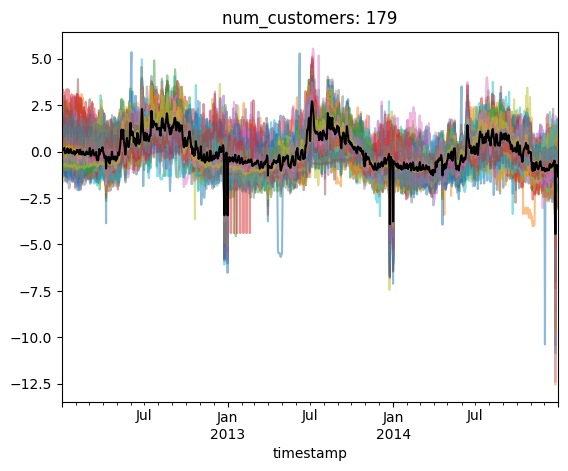

<Figure size 640x480 with 0 Axes>

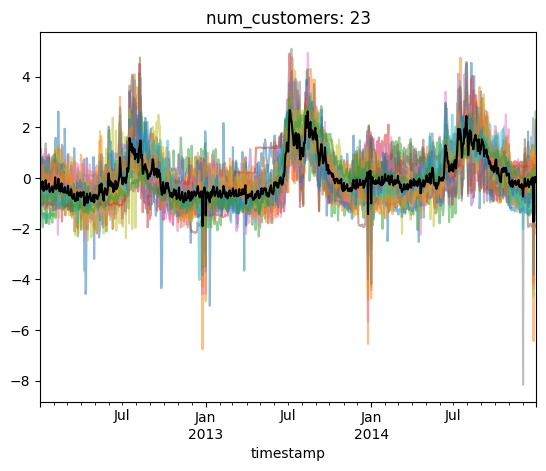

<Figure size 640x480 with 0 Axes>

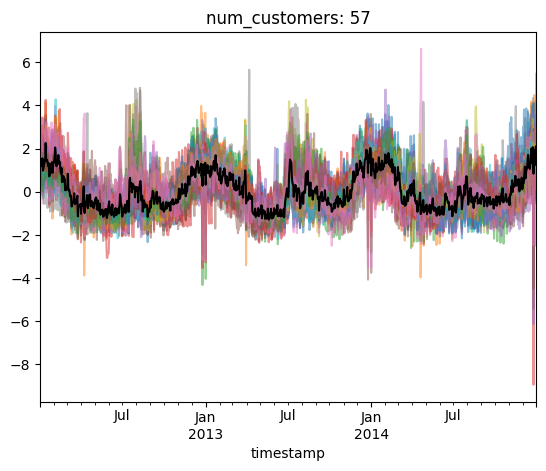

<Figure size 640x480 with 0 Axes>

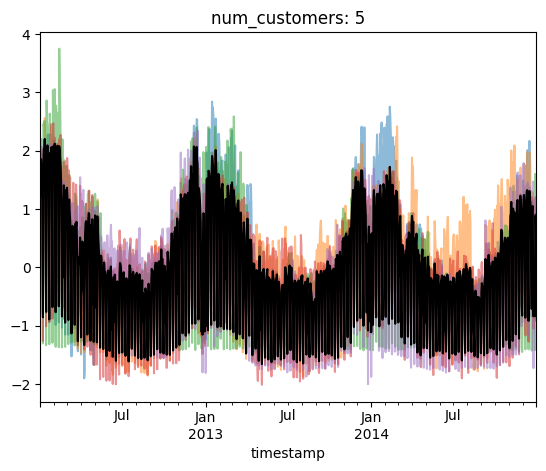

<Figure size 640x480 with 0 Axes>

In [830]:
custom_clusters = [
    [(1, 0, 0), (1, 1, 0), (1, 0, 4), (1, 0, -1), (1, 1, -1)],
    [(0, 1, 0)],
    [(0, 2, 0), (0, 2, 2), (2, 2, 0), (0, 2, -1), (0, 2, 1)],
    [(2, 3, 2)],
]

for cluster in custom_clusters:
    customers = list()
    for kshape_cluster, kmedoid_cluster, dbscan_cluster in cluster:
        customers.extend(list(labels_df.query(f'kshape == {kshape_cluster} and kmedoids == {kmedoid_cluster} and dbscan == {dbscan_cluster}').index.values))
    filtered_customers = normalized_daily_electricity_load_df[customers]
    ax = filtered_customers.plot(alpha=0.5)
    filtered_customers.mean(axis=1).plot(color='black', ax=ax)
    num_customers = len(customers)
    ax.set_title(f'num_customers: {num_customers}')
    ax.legend().remove()
    plt.show()
    plt.tight_layout()

In [831]:
customer_clusters = list()
for cluster in custom_clusters:
    customers = list()
    for kshape_cluster, kmedoid_cluster, dbscan_cluster in cluster:
        customers.extend(list(labels_df.query(f'kshape == {kshape_cluster} and kmedoids == {kmedoid_cluster} and dbscan == {dbscan_cluster}').index.values))
    customer_clusters.append(customers)

In [891]:
dataset_dir = 'dataset'
shutil.rmtree(dataset_dir)
for i, customers in enumerate(customer_clusters, start=1):
    df = filtered_daily_electricity_load_df[customers]
    df.index = df.index.strftime('%Y-%m-%d')
    train_size = round(len(df.index) * 0.80)
    validation_size = round(len(df.index) * 0.10)
    
    training_data = df.iloc[:train_size].T
    validation_data = df.iloc[train_size:train_size+validation_size].T
    test_data = df.iloc[train_size+validation_size:].T

    cluster_dir = os.path.join(dataset_dir, f'cluster_{i}')
    os.makedirs(cluster_dir)

    training_filepath = os.path.join(cluster_dir, 'training.parquet')
    validation_filepath = os.path.join(cluster_dir, 'validation.parquet')
    test_filepath = os.path.join(cluster_dir, 'test.parquet')
    
    training_data.to_parquet(training_filepath)
    validation_data.to_parquet(validation_filepath)
    test_data.to_parquet(test_filepath)

In [893]:
filtered_daily_electricity_load_df

,MT_001,MT_002,MT_003,MT_004,MT_005,MT_006,MT_007,MT_008,MT_009,MT_010,...,MT_360,MT_361,MT_362,MT_363,MT_364,MT_365,MT_366,MT_367,MT_368,MT_369
timestamp,,,,,,,,,,,,,,,,,,,,,
2012-01-02 00:00:00+00:00,255.393401,637.980085,119.244136,3041.158537,1535.975610,5789.434524,97.654042,6991.582492,2079.108392,1369.892473,...,12967.927632,7655.424697,865775.0,59893.459916,60767.045455,1867.992177,559.391457,13499.122037,3522.537563,19153.958944
2012-01-03 00:00:00+00:00,260.152284,719.061166,193.744570,2951.219512,1614.024390,5601.934524,91.153194,7014.309764,1949.300699,2042.204301,...,13908.168860,6002.676660,861250.0,57636.075949,68681.818182,1957.627119,659.742539,13883.669886,3903.171953,20083.027859
2012-01-04 00:00:00+00:00,273.477157,627.489331,342.311034,2924.288618,1663.109756,5698.660714,92.990390,6831.649832,1944.930070,1770.161290,...,12741.502193,7186.652391,855250.0,61664.556962,68431.818182,1877.118644,546.518432,13307.506585,3589.315526,19157.624633
2012-01-05 00:00:00+00:00,337.880711,660.206259,991.311903,2923.272358,1596.036585,5302.083333,82.815150,6597.643098,1966.346154,1930.107527,...,12813.322368,6597.787295,869650.0,58469.409283,65096.590909,1838.005215,614.686951,14112.598771,4696.160267,19960.777126
2012-01-06 00:00:00+00:00,332.804569,627.667141,59.730669,2851.626016,1568.597561,5565.476190,96.382137,6740.740741,1946.241259,2055.107527,...,12859.923246,7262.312634,861175.0,58832.278481,64051.136364,1891.786180,589.087185,14188.103600,4100.166945,20217.741935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-27 00:00:00+00:00,52.982234,536.450925,44.309296,3736.280488,1842.073171,5531.994048,126.059921,7187.710438,1491.695804,1404.569892,...,8652.412281,7064.239829,788950.0,54845.991561,65227.272727,2109.843546,174.517262,13370.280948,1955.759599,17742.118768
2014-12-28 00:00:00+00:00,56.789340,532.894737,37.793223,3581.808943,1694.207317,5030.505952,107.405314,6313.973064,1279.720280,1198.655914,...,10106.085526,7203.783012,818025.0,55180.379747,64369.318182,2042.372881,138.092452,11478.709394,1101.419032,16533.907625
2014-12-29 00:00:00+00:00,62.182741,553.165007,40.182450,3516.768293,1799.695122,5706.101190,137.648389,7571.548822,1674.388112,1584.408602,...,10357.182018,7206.281228,777275.0,51713.080169,67272.727273,2109.517601,288.472791,13482.221247,3228.714524,18470.674487


In [898]:
[len(cluster) for cluster in customer_clusters]

[179, 23, 57, 5]

In [901]:
test_size

109